Number of images in Normal class: 1589
Number of images in Osteoarthritis class: 2257


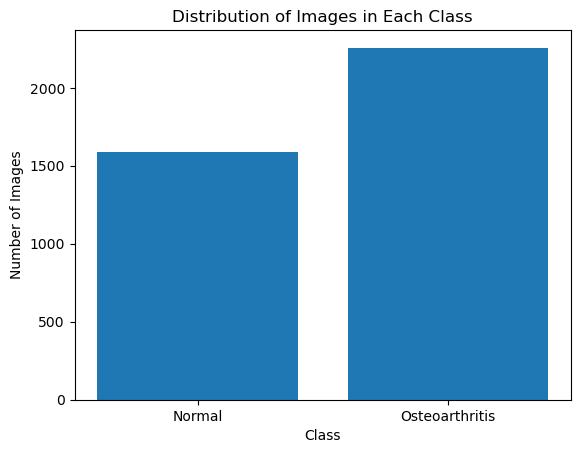

In [1]:
import os
import cv2
import matplotlib.pyplot as plt

def load_and_resize_images_from_folder(folder, target_size=(224, 224)):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.resize(img, target_size)
            images.append(img)
    return images

# Load images from directories for each class
normal_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Normal')
osteoarthritis_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Osteoarthritis')

# Display the number of images in each class
print("Number of images in Normal class:", len(normal_images))
print("Number of images in Osteoarthritis class:", len(osteoarthritis_images))

# Create a histogram to visualize the distribution of images in each class
plt.bar(['Normal', 'Osteoarthritis'], [len(normal_images), len(osteoarthritis_images)])
plt.title('Distribution of Images in Each Class')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.show()


2024-03-28 15:54:50.411583: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-28 15:54:50.412957: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-28 15:54:50.480174: I external/local_tsl/tsl/cuda/cudart_stub.cc:32] Could not find cuda drivers on your machine, GPU will not be used.
2024-03-28 15:54:50.778936: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-28 15:54:51.400284: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warnin

Number of images in Normal class: 1589
Number of images in Osteoarthritis class: 2257
Number of images in Normal class after augmentation: 2257


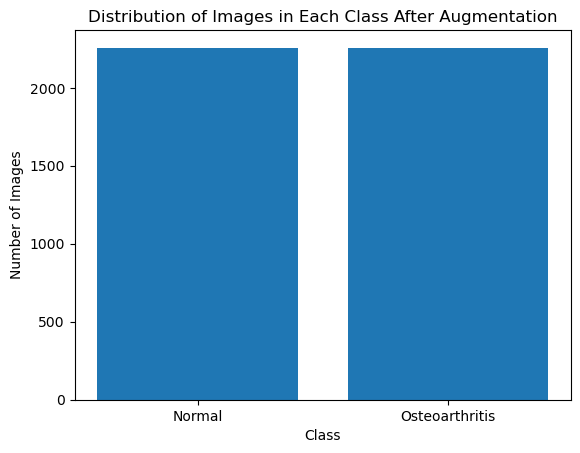

In [2]:
import os
import cv2
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

# Define a function to load and resize images from a folder
def load_and_resize_images_from_folder(folder, target_size=(224, 224)):
    images = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            img = cv2.resize(img, target_size)
            images.append(img)
    return images

# Load images from directories for each class
normal_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Normal')
osteoarthritis_images = load_and_resize_images_from_folder('/home/lab4/ML2/OsteoArthritis-20240311T154242Z-001/OsteoArthritis/Osteoarthritis')

# Display the number of images in each class
print("Number of images in Normal class:", len(normal_images))
print("Number of images in Osteoarthritis class:", len(osteoarthritis_images))

# Check if data augmentation is needed
if len(normal_images) < len(osteoarthritis_images):
    # Calculate the number of additional images needed
    num_additional_images = len(osteoarthritis_images) - len(normal_images)

    # Create an ImageDataGenerator for data augmentation
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )

    # Choose random indices from the "Normal" class for augmentation
    sampled_indices = np.random.randint(0, len(normal_images), size=num_additional_images)

    # Perform data augmentation and append augmented images to the "Normal" class
    for index in sampled_indices:
        img = normal_images[index]
        img = img.reshape((1,) + img.shape)  # Reshape for flow() function
        for batch in datagen.flow(img, batch_size=1):
            normal_images.append(batch[0])  # Append augmented images
            break  # Exit the loop after one iteration of data augmentation

    # Display the number of images in the "Normal" class after augmentation
    print("Number of images in Normal class after augmentation:", len(normal_images))

# Create a histogram to visualize the distribution of images in each class after augmentation
plt.bar(['Normal', 'Osteoarthritis'], [len(normal_images), len(osteoarthritis_images)])
plt.title('Distribution of Images in Each Class After Augmentation')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.show()


In [3]:
import random

# Set a seed for reproducibility
random.seed(42)

# Randomly select 1000 images from each class
selected_normal_images = random.sample(normal_images, 2000)
selected_osteoarthritis_images = random.sample(osteoarthritis_images, 2000)

# Combine selected images from both classes
selected_images = selected_normal_images + selected_osteoarthritis_images
labels = [0] * 2000 + [1] * 2000  # Assign labels (0 for Normal, 1 for Osteoarthritis)

# Split the selected images and labels into train and test sets (70:30 ratio)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(selected_images, labels, test_size=0.3, random_state=42)

# Split the train set into train and validation sets (80:20 ratio)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Print the sizes of train, test, and validation sets
print("X_train size:", len(X_train))
print("X_test size:", len(X_test))
print("X_validation size:", len(X_val))


X_train size: 2240
X_test size: 1200
X_validation size: 560


In [4]:
import cv2

def preprocess_image_cv2(image):
    # Resize image to (224, 224)
    resized_image = cv2.resize(image, (224, 224))
    # Scale pixel values to [0, 1]
    normalized_image = resized_image / 255.0
    return normalized_image

# Preprocess images in your dataset
X_train_preprocessed = np.array([preprocess_image_cv2(img) for img in X_train])
X_val_preprocessed = np.array([preprocess_image_cv2(img) for img in X_val])
X_test_preprocessed = np.array([preprocess_image_cv2(img) for img in X_test])

In [5]:
import pandas as pd
from sklearn.metrics import cohen_kappa_score,balanced_accuracy_score,matthews_corrcoef

# Denset201

In [6]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,290,113 (77.40 MB)

 Trainable params: 1,968,129 (7.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

                                                                                                  
 conv4_block8_2_conv (Conv2  (None, 14, 14, 32)           36864     ['conv4_block8_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv4_block8_concat (Conca  (None, 14, 14, 512)          0         ['conv4_block7_concat[0][0]', 
 tenate)                                                             'conv4_block8_2_conv[0][0]'] 
                                                                                                  
 conv4_block9_0_bn (BatchNo  (None, 14, 14, 512)          2048      ['conv4_block8_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block12_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block12_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block12_concat (Conc  (None, 14, 14, 640)          0         ['conv4_block11_concat[0][0]',
 atenate)                                                            'conv4_block12_2_conv[0][0]']
                                                                                                  
 conv4_block13_0_bn (BatchN  (None, 14, 14, 640)          2560      ['conv4_block12_concat[0][0]']
 ormalization)                                                                                    
          

 conv4_block16_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block16_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block16_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block16_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block16_concat (Conc  (None, 14, 14, 768)          0         ['conv4_block15_concat[0][0]',
 atenate)                                                            'conv4_block16_2_conv[0][0]']
                                                                                                  
 conv4_block17_0_bn (BatchN  (None, 14, 14, 768)          3072      ['conv4_block16_concat[0][0]']
 ormalizat

                                                                                                  
 conv4_block20_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block20_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block20_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block20_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block20_concat (Conc  (None, 14, 14, 896)          0         ['conv4_block19_concat[0][0]',
 atenate)                                                            'conv4_block20_2_conv[0][0]']
                                                                                                  
 conv4_blo

 ormalization)                                                                                    
                                                                                                  
 conv4_block24_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block24_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block24_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block24_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block24_concat (Conc  (None, 14, 14, 1024)         0         ['conv4_block23_concat[0][0]',
 atenate)                                                            'conv4_block24_2_conv[0][0]']
          

 conv4_block28_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block28_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block28_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block28_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block28_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block28_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block28_concat (Conc  (None, 14, 14, 1152)         0         ['conv4_block27_concat[0][0]',
 atenate) 

                                                                                                  
 conv4_block32_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block32_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block32_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block32_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block32_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block32_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_blo

 2D)                                                                                              
                                                                                                  
 conv4_block36_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block36_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block36_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block36_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block36_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block36_1_relu[0][0]']
 2D)                                                                                              
          

 conv4_block40_1_conv (Conv  (None, 14, 14, 128)          192512    ['conv4_block40_0_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block40_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block40_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block40_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block40_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block40_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block40_1_relu[0][0]']
 2D)      

                                                                                                  
 conv4_block44_1_conv (Conv  (None, 14, 14, 128)          208896    ['conv4_block44_0_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block44_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block44_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block44_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block44_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block48_1_conv (Conv  (None, 14, 14, 128)          225280    ['conv4_block48_0_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block48_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block48_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block48_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block48_1_bn[0][0]']  
 vation)                                                                                          
          

                                                                                                  
 conv5_block3_2_conv (Conv2  (None, 7, 7, 32)             36864     ['conv5_block3_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block3_concat (Conca  (None, 7, 7, 992)            0         ['conv5_block2_concat[0][0]', 
 tenate)                                                             'conv5_block3_2_conv[0][0]'] 
                                                                                                  
 conv5_block4_0_bn (BatchNo  (None, 7, 7, 992)            3968      ['conv5_block3_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_blo

 ation)                                                                                           
                                                                                                  
 conv5_block7_2_conv (Conv2  (None, 7, 7, 32)             36864     ['conv5_block7_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block7_concat (Conca  (None, 7, 7, 1120)           0         ['conv5_block6_concat[0][0]', 
 tenate)                                                             'conv5_block7_2_conv[0][0]'] 
                                                                                                  
 conv5_block8_0_bn (BatchNo  (None, 7, 7, 1120)           4480      ['conv5_block7_concat[0][0]'] 
 rmalization)                                                                                     
          

 conv5_block11_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block11_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block11_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block11_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block11_concat (Conc  (None, 7, 7, 1248)           0         ['conv5_block10_concat[0][0]',
 atenate)                                                            'conv5_block11_2_conv[0][0]']
                                                                                                  
 conv5_block12_0_bn (BatchN  (None, 7, 7, 1248)           4992      ['conv5_block11_concat[0][0]']
 ormalizat

                                                                                                  
 conv5_block15_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block15_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block15_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block15_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block15_concat (Conc  (None, 7, 7, 1376)           0         ['conv5_block14_concat[0][0]',
 atenate)                                                            'conv5_block15_2_conv[0][0]']
                                                                                                  
 conv5_blo

 ormalization)                                                                                    
                                                                                                  
 conv5_block19_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block19_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block19_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block19_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block19_concat (Conc  (None, 7, 7, 1504)           0         ['conv5_block18_concat[0][0]',
 atenate)                                                            'conv5_block19_2_conv[0][0]']
          

 conv5_block23_1_bn (BatchN  (None, 7, 7, 128)            512       ['conv5_block23_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block23_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block23_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block23_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block23_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block23_concat (Conc  (None, 7, 7, 1632)           0         ['conv5_block22_concat[0][0]',
 atenate) 

                                                                                                  
 conv5_block27_1_bn (BatchN  (None, 7, 7, 128)            512       ['conv5_block27_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block27_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block27_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block27_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block27_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_blo

 2D)                                                                                              
                                                                                                  
 conv5_block31_1_bn (BatchN  (None, 7, 7, 128)            512       ['conv5_block31_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block31_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block31_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block31_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block31_1_relu[0][0]']
 2D)                                                                                              
          

In [8]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8763 - loss: 0.2979 - val_accuracy: 0.8661 - val_loss: 0.3085
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.8979 - loss: 0.2667 - val_accuracy: 0.8482 - val_loss: 0.3538
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.8879 - loss: 0.2884 - val_accuracy: 0.8768 - val_loss: 0.2980
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 74s 1s/step - accuracy: 0.9012 - loss: 0.2546 - val_accuracy: 0.8804 - val_loss: 0.2882
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.8994 - loss: 0.2497 - val_accuracy: 0.8893 - val_loss: 0.2824
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.9107 - loss: 0.2297 - val_accuracy: 0.8893 - val_loss: 0.2788
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9196 - loss: 0.2104 - val_accuracy: 0.8857 - val_loss: 0.2772
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9168 - loss: 0.2137 - val_accuracy: 0.8964 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 889ms/step
Inference Time: 17.834048986434937 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


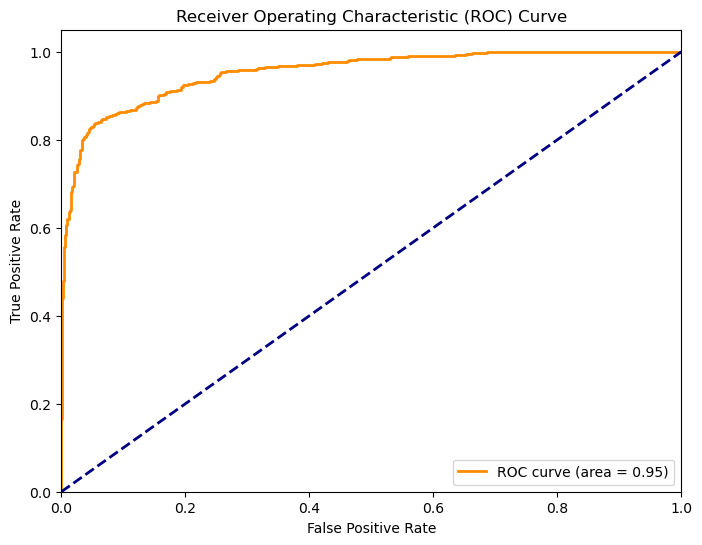

Validation Loss: 0.2696782350540161
Validation Accuracy: 0.8910714387893677
Test Loss: 0.2735264003276825
Test Accuracy: 0.89083331823349
ROC AUC: 0.9530340791508585
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [9]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv', index=False)
print("Metrics saved successfully")

In [10]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9455 - loss: 0.1610 - val_accuracy: 0.8857 - val_loss: 0.2755
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9601 - loss: 0.1414 - val_accuracy: 0.8750 - val_loss: 0.3073
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9503 - loss: 0.1522 - val_accuracy: 0.8946 - val_loss: 0.2712
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9577 - loss: 0.1397 - val_accuracy: 0.8786 - val_loss: 0.2984
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9537 - loss: 0.1318 - val_accuracy: 0.8929 - val_loss: 0.2749
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9587 - loss: 0.1282 - val_accuracy: 0.8893 - val_loss: 0.2728
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9627 - loss: 0.1253 - val_accuracy: 0.8714 - val_loss: 0.3103
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9662 - loss: 0.1238 - val_accuracy: 0.8839 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 786ms/step
Inference Time: 14.384835004806519 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step


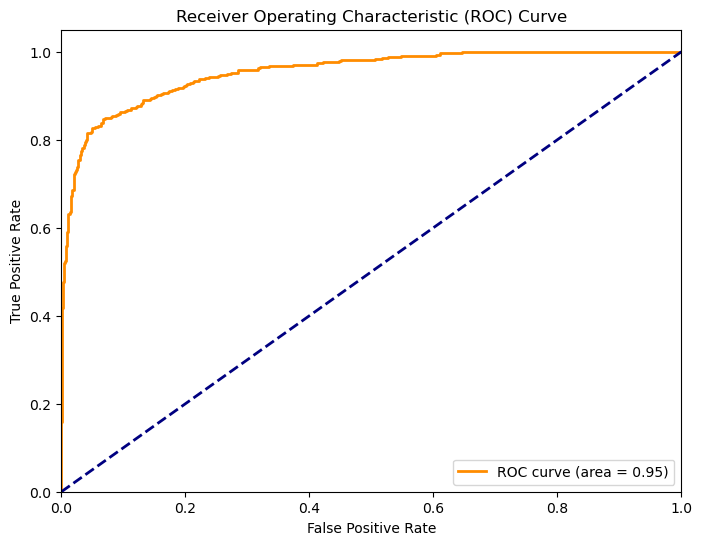

Validation Loss: 0.27120664715766907
Validation Accuracy: 0.8946428298950195
Test Loss: 0.2754581570625305
Test Accuracy: 0.8858333230018616
ROC AUC: 0.9531926256411397
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [11]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv', index=False)
print("Metrics saved successfully")

In [12]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9607 - loss: 0.1278 - val_accuracy: 0.8857 - val_loss: 0.2924
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9571 - loss: 0.1346 - val_accuracy: 0.8911 - val_loss: 0.2848
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9584 - loss: 0.1334 - val_accuracy: 0.8804 - val_loss: 0.2934
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9542 - loss: 0.1274 - val_accuracy: 0.8911 - val_loss: 0.2834
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9653 - loss: 0.1189 - val_accuracy: 0.8875 - val_loss: 0.2754
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9621 - loss: 0.1234 - val_accuracy: 0.8839 - val_loss: 0.2825
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9685 - loss: 0.1117 - val_accuracy: 0.8893 - val_loss: 0.2853
Epoch 8/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9690 - loss: 0.1241 - val_accuracy: 0.8839 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 783ms/step
Inference Time: 14.323370695114136 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step


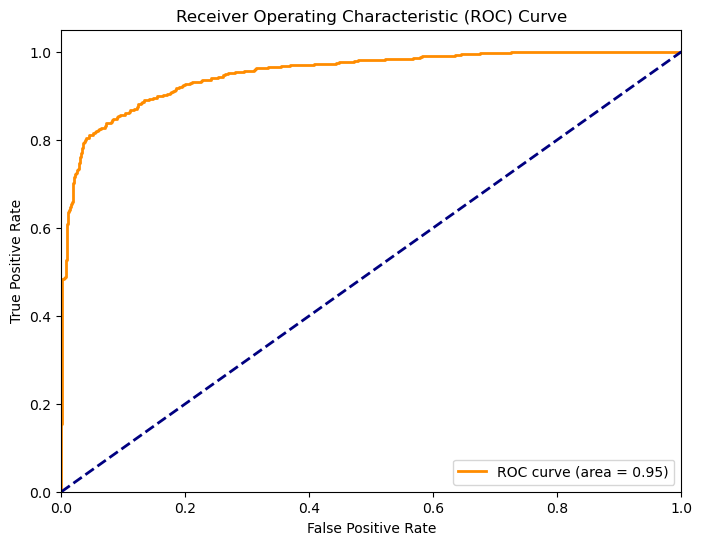

Validation Loss: 0.27542340755462646
Validation Accuracy: 0.887499988079071
Test Loss: 0.28448066115379333
Test Accuracy: 0.878333330154419
ROC AUC: 0.9510703278852679
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [13]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv', index=False)
print("Metrics saved successfully")

In [14]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9638 - loss: 0.1285 - val_accuracy: 0.8750 - val_loss: 0.3351
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9581 - loss: 0.1275 - val_accuracy: 0.8607 - val_loss: 0.3300
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9612 - loss: 0.1230 - val_accuracy: 0.8786 - val_loss: 0.2943
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9684 - loss: 0.1030 - val_accuracy: 0.8857 - val_loss: 0.2857
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9665 - loss: 0.1049 - val_accuracy: 0.8750 - val_loss: 0.2957
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9758 - loss: 0.0995 - val_accuracy: 0.8893 - val_loss: 0.2931
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9768 - loss: 0.0916 - val_accuracy: 0.8839 - val_loss: 0.2849
Epoch 8/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9799 - loss: 0.0823 - val_accuracy: 0.8857 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 784ms/step
Inference Time: 14.337823152542114 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


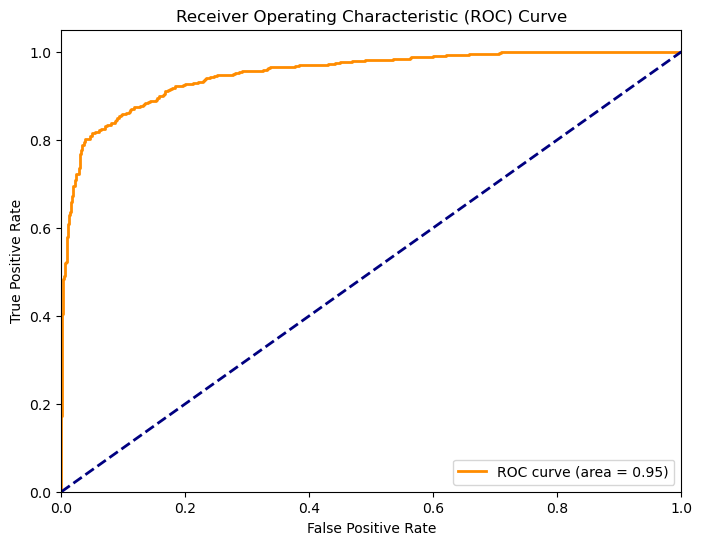

Validation Loss: 0.2848667800426483
Validation Accuracy: 0.8839285969734192
Test Loss: 0.2957210838794708
Test Accuracy: 0.8766666650772095
ROC AUC: 0.9503832930940487
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [15]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

# Save metrics to a DataFrame and then to a CSV file
metrics = {
    'Combination':'Densenet',
    'Validation Accuracy':val_accuracy*100,
    'Validation Loss':val_loss,
    'Test Accuracy':test_accuracy*100,
    'Test Loss':test_loss,
    'Training time':training_time,
    'Inference time':inference_time,
    'Cohens Kappa':kappa,
    'MCC':mcc,
    'Balanced Accuracy':balanced_accuracy
}
metrics_df = pd.DataFrame(metrics, index=[0])
metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv', index=False)
print("Metrics saved successfully")

# Densenet+Dense

In [16]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Add an additional dense layer
x = Dense(512, activation='relu')(predictions)  # Example dense layer with 512 units

# Combine base model, custom classification head, and additional dense layer
model = Model(inputs=base_model.input, outputs=x)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,291,137 (77.40 MB)

 Trainable params: 1,969,153 (7.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

 rmalization)                                                                                     
                                                                                                  
 conv3_block1_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block1_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block1_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block1_concat (Conca  (None, 28, 28, 160)          0         ['pool2_pool[0][0]',          
 tenate)                                                             'conv3_block1_2_conv[0][0]'] 
          

 conv3_block5_1_bn (BatchNo  (None, 28, 28, 128)          512       ['conv3_block5_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block5_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block5_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block5_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block5_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block5_concat (Conca  (None, 28, 28, 288)          0         ['conv3_block4_concat[0][0]', 
 tenate)  

                                                                                                  
 conv3_block9_1_bn (BatchNo  (None, 28, 28, 128)          512       ['conv3_block9_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block9_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block9_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block9_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block9_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_blo

 pool3_pool (AveragePooling  (None, 14, 14, 256)          0         ['pool3_conv[0][0]']          
 2D)                                                                                              
                                                                                                  
 conv4_block1_0_bn (BatchNo  (None, 14, 14, 256)          1024      ['pool3_pool[0][0]']          
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_0_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_1_conv (Conv2  (None, 14, 14, 128)          32768     ['conv4_block1_0_relu[0][0]'] 
 D)       

                                                                                                  
 conv4_block4_concat (Conca  (None, 14, 14, 384)          0         ['conv4_block3_concat[0][0]', 
 tenate)                                                             'conv4_block4_2_conv[0][0]'] 
                                                                                                  
 conv4_block5_0_bn (BatchNo  (None, 14, 14, 384)          1536      ['conv4_block4_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block5_0_relu (Activ  (None, 14, 14, 384)          0         ['conv4_block5_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block8_concat (Conca  (None, 14, 14, 512)          0         ['conv4_block7_concat[0][0]', 
 tenate)                                                             'conv4_block8_2_conv[0][0]'] 
                                                                                                  
 conv4_block9_0_bn (BatchNo  (None, 14, 14, 512)          2048      ['conv4_block8_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block9_0_relu (Activ  (None, 14, 14, 512)          0         ['conv4_block9_0_bn[0][0]']   
 ation)                                                                                           
          

 conv4_block12_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block12_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block12_concat (Conc  (None, 14, 14, 640)          0         ['conv4_block11_concat[0][0]',
 atenate)                                                            'conv4_block12_2_conv[0][0]']
                                                                                                  
 conv4_block13_0_bn (BatchN  (None, 14, 14, 640)          2560      ['conv4_block12_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block13_0_relu (Acti  (None, 14, 14, 640)          0         ['conv4_block13_0_bn[0][0]']  
 vation)  

                                                                                                  
 conv4_block16_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block16_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block16_concat (Conc  (None, 14, 14, 768)          0         ['conv4_block15_concat[0][0]',
 atenate)                                                            'conv4_block16_2_conv[0][0]']
                                                                                                  
 conv4_block17_0_bn (BatchN  (None, 14, 14, 768)          3072      ['conv4_block16_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block20_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block20_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block20_concat (Conc  (None, 14, 14, 896)          0         ['conv4_block19_concat[0][0]',
 atenate)                                                            'conv4_block20_2_conv[0][0]']
                                                                                                  
 conv4_block21_0_bn (BatchN  (None, 14, 14, 896)          3584      ['conv4_block20_concat[0][0]']
 ormalization)                                                                                    
          

 conv4_block24_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block24_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block24_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block24_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block24_concat (Conc  (None, 14, 14, 1024)         0         ['conv4_block23_concat[0][0]',
 atenate)                                                            'conv4_block24_2_conv[0][0]']
                                                                                                  
 conv4_block25_0_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block24_concat[0][0]']
 ormalizat

                                                                                                  
 conv4_block28_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block28_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block28_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block28_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block28_concat (Conc  (None, 14, 14, 1152)         0         ['conv4_block27_concat[0][0]',
 atenate)                                                            'conv4_block28_2_conv[0][0]']
                                                                                                  
 conv4_blo

 ormalization)                                                                                    
                                                                                                  
 conv4_block32_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block32_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block32_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block32_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block32_concat (Conc  (None, 14, 14, 1280)         0         ['conv4_block31_concat[0][0]',
 atenate)                                                            'conv4_block32_2_conv[0][0]']
          

 conv4_block36_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block36_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block36_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block36_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block36_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block36_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block36_concat (Conc  (None, 14, 14, 1408)         0         ['conv4_block35_concat[0][0]',
 atenate) 

                                                                                                  
 conv4_block40_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block40_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block40_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block40_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block40_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block40_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_blo

 2D)                                                                                              
                                                                                                  
 conv4_block44_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block44_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block44_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block44_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block44_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block44_1_relu[0][0]']
 2D)                                                                                              
          

 conv4_block48_1_conv (Conv  (None, 14, 14, 128)          225280    ['conv4_block48_0_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block48_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block48_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block48_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block48_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block48_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block48_1_relu[0][0]']
 2D)      

 D)                                                                                               
                                                                                                  
 conv5_block3_concat (Conca  (None, 7, 7, 992)            0         ['conv5_block2_concat[0][0]', 
 tenate)                                                             'conv5_block3_2_conv[0][0]'] 
                                                                                                  
 conv5_block4_0_bn (BatchNo  (None, 7, 7, 992)            3968      ['conv5_block3_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block4_0_relu (Activ  (None, 7, 7, 992)            0         ['conv5_block4_0_bn[0][0]']   
 ation)                                                                                           
          

 conv5_block7_2_conv (Conv2  (None, 7, 7, 32)             36864     ['conv5_block7_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block7_concat (Conca  (None, 7, 7, 1120)           0         ['conv5_block6_concat[0][0]', 
 tenate)                                                             'conv5_block7_2_conv[0][0]'] 
                                                                                                  
 conv5_block8_0_bn (BatchNo  (None, 7, 7, 1120)           4480      ['conv5_block7_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block8_0_relu (Activ  (None, 7, 7, 1120)           0         ['conv5_block8_0_bn[0][0]']   
 ation)   

                                                                                                  
 conv5_block11_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block11_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block11_concat (Conc  (None, 7, 7, 1248)           0         ['conv5_block10_concat[0][0]',
 atenate)                                                            'conv5_block11_2_conv[0][0]']
                                                                                                  
 conv5_block12_0_bn (BatchN  (None, 7, 7, 1248)           4992      ['conv5_block11_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_blo

 vation)                                                                                          
                                                                                                  
 conv5_block15_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block15_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block15_concat (Conc  (None, 7, 7, 1376)           0         ['conv5_block14_concat[0][0]',
 atenate)                                                            'conv5_block15_2_conv[0][0]']
                                                                                                  
 conv5_block16_0_bn (BatchN  (None, 7, 7, 1376)           5504      ['conv5_block15_concat[0][0]']
 ormalization)                                                                                    
          

 conv5_block19_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block19_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block19_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block19_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block19_concat (Conc  (None, 7, 7, 1504)           0         ['conv5_block18_concat[0][0]',
 atenate)                                                            'conv5_block19_2_conv[0][0]']
                                                                                                  
 conv5_block20_0_bn (BatchN  (None, 7, 7, 1504)           6016      ['conv5_block19_concat[0][0]']
 ormalizat

                                                                                                  
 conv5_block23_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block23_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block23_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block23_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block23_concat (Conc  (None, 7, 7, 1632)           0         ['conv5_block22_concat[0][0]',
 atenate)                                                            'conv5_block23_2_conv[0][0]']
                                                                                                  
 conv5_blo

 ormalization)                                                                                    
                                                                                                  
 conv5_block27_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block27_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block27_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block27_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block27_concat (Conc  (None, 7, 7, 1760)           0         ['conv5_block26_concat[0][0]',
 atenate)                                                            'conv5_block27_2_conv[0][0]']
          

 conv5_block31_1_bn (BatchN  (None, 7, 7, 128)            512       ['conv5_block31_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block31_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block31_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block31_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block31_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block31_concat (Conc  (None, 7, 7, 1888)           0         ['conv5_block30_concat[0][0]',
 atenate) 

In [17]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50


ValueError: Arguments `target` and `output` must have the same rank (ndim). Received: target.shape=(32,), output.shape=(32, 512)

In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [ ]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


In [ ]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Dropout(1)+Dense(2)

In [18]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

# Add first dense layer
x = Dense(512, activation='relu')(x)

# Add dropout layer
x = Dropout(0.5)(x)  # Adding dropout with rate 0.5

# Add second dense layer
x = Dense(256, activation='relu')(x)

predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,945,473 (79.90 MB)

 Trainable params: 2,623,489 (10.01 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

 rmalization)                                                                                     
                                                                                                  
 conv3_block1_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block1_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block1_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block1_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block1_concat (Conca  (None, 28, 28, 160)          0         ['pool2_pool[0][0]',          
 tenate)                                                             'conv3_block1_2_conv[0][0]'] 
          

 conv3_block5_1_bn (BatchNo  (None, 28, 28, 128)          512       ['conv3_block5_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block5_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block5_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block5_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block5_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_block5_concat (Conca  (None, 28, 28, 288)          0         ['conv3_block4_concat[0][0]', 
 tenate)  

                                                                                                  
 conv3_block9_1_bn (BatchNo  (None, 28, 28, 128)          512       ['conv3_block9_1_conv[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv3_block9_1_relu (Activ  (None, 28, 28, 128)          0         ['conv3_block9_1_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv3_block9_2_conv (Conv2  (None, 28, 28, 32)           36864     ['conv3_block9_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv3_blo

 pool3_pool (AveragePooling  (None, 14, 14, 256)          0         ['pool3_conv[0][0]']          
 2D)                                                                                              
                                                                                                  
 conv4_block1_0_bn (BatchNo  (None, 14, 14, 256)          1024      ['pool3_pool[0][0]']          
 rmalization)                                                                                     
                                                                                                  
 conv4_block1_0_relu (Activ  (None, 14, 14, 256)          0         ['conv4_block1_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_block1_1_conv (Conv2  (None, 14, 14, 128)          32768     ['conv4_block1_0_relu[0][0]'] 
 D)       

                                                                                                  
 conv4_block4_concat (Conca  (None, 14, 14, 384)          0         ['conv4_block3_concat[0][0]', 
 tenate)                                                             'conv4_block4_2_conv[0][0]'] 
                                                                                                  
 conv4_block5_0_bn (BatchNo  (None, 14, 14, 384)          1536      ['conv4_block4_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block5_0_relu (Activ  (None, 14, 14, 384)          0         ['conv4_block5_0_bn[0][0]']   
 ation)                                                                                           
                                                                                                  
 conv4_blo

 D)                                                                                               
                                                                                                  
 conv4_block8_concat (Conca  (None, 14, 14, 512)          0         ['conv4_block7_concat[0][0]', 
 tenate)                                                             'conv4_block8_2_conv[0][0]'] 
                                                                                                  
 conv4_block9_0_bn (BatchNo  (None, 14, 14, 512)          2048      ['conv4_block8_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv4_block9_0_relu (Activ  (None, 14, 14, 512)          0         ['conv4_block9_0_bn[0][0]']   
 ation)                                                                                           
          

 conv4_block12_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block12_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block12_concat (Conc  (None, 14, 14, 640)          0         ['conv4_block11_concat[0][0]',
 atenate)                                                            'conv4_block12_2_conv[0][0]']
                                                                                                  
 conv4_block13_0_bn (BatchN  (None, 14, 14, 640)          2560      ['conv4_block12_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block13_0_relu (Acti  (None, 14, 14, 640)          0         ['conv4_block13_0_bn[0][0]']  
 vation)  

                                                                                                  
 conv4_block16_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block16_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block16_concat (Conc  (None, 14, 14, 768)          0         ['conv4_block15_concat[0][0]',
 atenate)                                                            'conv4_block16_2_conv[0][0]']
                                                                                                  
 conv4_block17_0_bn (BatchN  (None, 14, 14, 768)          3072      ['conv4_block16_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_blo

 vation)                                                                                          
                                                                                                  
 conv4_block20_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block20_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block20_concat (Conc  (None, 14, 14, 896)          0         ['conv4_block19_concat[0][0]',
 atenate)                                                            'conv4_block20_2_conv[0][0]']
                                                                                                  
 conv4_block21_0_bn (BatchN  (None, 14, 14, 896)          3584      ['conv4_block20_concat[0][0]']
 ormalization)                                                                                    
          

 conv4_block24_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block24_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block24_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block24_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block24_concat (Conc  (None, 14, 14, 1024)         0         ['conv4_block23_concat[0][0]',
 atenate)                                                            'conv4_block24_2_conv[0][0]']
                                                                                                  
 conv4_block25_0_bn (BatchN  (None, 14, 14, 1024)         4096      ['conv4_block24_concat[0][0]']
 ormalizat

                                                                                                  
 conv4_block28_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block28_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block28_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block28_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block28_concat (Conc  (None, 14, 14, 1152)         0         ['conv4_block27_concat[0][0]',
 atenate)                                                            'conv4_block28_2_conv[0][0]']
                                                                                                  
 conv4_blo

 ormalization)                                                                                    
                                                                                                  
 conv4_block32_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block32_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block32_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block32_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block32_concat (Conc  (None, 14, 14, 1280)         0         ['conv4_block31_concat[0][0]',
 atenate)                                                            'conv4_block32_2_conv[0][0]']
          

 conv4_block36_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block36_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block36_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block36_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block36_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block36_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block36_concat (Conc  (None, 14, 14, 1408)         0         ['conv4_block35_concat[0][0]',
 atenate) 

                                                                                                  
 conv4_block40_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block40_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block40_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block40_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block40_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block40_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_blo

 2D)                                                                                              
                                                                                                  
 conv4_block44_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block44_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block44_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block44_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block44_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block44_1_relu[0][0]']
 2D)                                                                                              
          

 conv4_block48_1_conv (Conv  (None, 14, 14, 128)          225280    ['conv4_block48_0_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv4_block48_1_bn (BatchN  (None, 14, 14, 128)          512       ['conv4_block48_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv4_block48_1_relu (Acti  (None, 14, 14, 128)          0         ['conv4_block48_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv4_block48_2_conv (Conv  (None, 14, 14, 32)           36864     ['conv4_block48_1_relu[0][0]']
 2D)      

 D)                                                                                               
                                                                                                  
 conv5_block3_concat (Conca  (None, 7, 7, 992)            0         ['conv5_block2_concat[0][0]', 
 tenate)                                                             'conv5_block3_2_conv[0][0]'] 
                                                                                                  
 conv5_block4_0_bn (BatchNo  (None, 7, 7, 992)            3968      ['conv5_block3_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block4_0_relu (Activ  (None, 7, 7, 992)            0         ['conv5_block4_0_bn[0][0]']   
 ation)                                                                                           
          

 conv5_block7_2_conv (Conv2  (None, 7, 7, 32)             36864     ['conv5_block7_1_relu[0][0]'] 
 D)                                                                                               
                                                                                                  
 conv5_block7_concat (Conca  (None, 7, 7, 1120)           0         ['conv5_block6_concat[0][0]', 
 tenate)                                                             'conv5_block7_2_conv[0][0]'] 
                                                                                                  
 conv5_block8_0_bn (BatchNo  (None, 7, 7, 1120)           4480      ['conv5_block7_concat[0][0]'] 
 rmalization)                                                                                     
                                                                                                  
 conv5_block8_0_relu (Activ  (None, 7, 7, 1120)           0         ['conv5_block8_0_bn[0][0]']   
 ation)   

                                                                                                  
 conv5_block11_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block11_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block11_concat (Conc  (None, 7, 7, 1248)           0         ['conv5_block10_concat[0][0]',
 atenate)                                                            'conv5_block11_2_conv[0][0]']
                                                                                                  
 conv5_block12_0_bn (BatchN  (None, 7, 7, 1248)           4992      ['conv5_block11_concat[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_blo

 vation)                                                                                          
                                                                                                  
 conv5_block15_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block15_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block15_concat (Conc  (None, 7, 7, 1376)           0         ['conv5_block14_concat[0][0]',
 atenate)                                                            'conv5_block15_2_conv[0][0]']
                                                                                                  
 conv5_block16_0_bn (BatchN  (None, 7, 7, 1376)           5504      ['conv5_block15_concat[0][0]']
 ormalization)                                                                                    
          

 conv5_block19_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block19_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block19_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block19_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block19_concat (Conc  (None, 7, 7, 1504)           0         ['conv5_block18_concat[0][0]',
 atenate)                                                            'conv5_block19_2_conv[0][0]']
                                                                                                  
 conv5_block20_0_bn (BatchN  (None, 7, 7, 1504)           6016      ['conv5_block19_concat[0][0]']
 ormalizat

                                                                                                  
 conv5_block23_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block23_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block23_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block23_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block23_concat (Conc  (None, 7, 7, 1632)           0         ['conv5_block22_concat[0][0]',
 atenate)                                                            'conv5_block23_2_conv[0][0]']
                                                                                                  
 conv5_blo

 ormalization)                                                                                    
                                                                                                  
 conv5_block27_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block27_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block27_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block27_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block27_concat (Conc  (None, 7, 7, 1760)           0         ['conv5_block26_concat[0][0]',
 atenate)                                                            'conv5_block27_2_conv[0][0]']
          

 conv5_block31_1_bn (BatchN  (None, 7, 7, 128)            512       ['conv5_block31_1_conv[0][0]']
 ormalization)                                                                                    
                                                                                                  
 conv5_block31_1_relu (Acti  (None, 7, 7, 128)            0         ['conv5_block31_1_bn[0][0]']  
 vation)                                                                                          
                                                                                                  
 conv5_block31_2_conv (Conv  (None, 7, 7, 32)             36864     ['conv5_block31_1_relu[0][0]']
 2D)                                                                                              
                                                                                                  
 conv5_block31_concat (Conc  (None, 7, 7, 1888)           0         ['conv5_block30_concat[0][0]',
 atenate) 

In [19]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.6231 - loss: 0.6438 - val_accuracy: 0.8232 - val_loss: 0.4317
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.8109 - loss: 0.4224 - val_accuracy: 0.8714 - val_loss: 0.3269
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8446 - loss: 0.3436 - val_accuracy: 0.8714 - val_loss: 0.3128
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8548 - loss: 0.3249 - val_accuracy: 0.8821 - val_loss: 0.2869
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8740 - loss: 0.3052 - val_accuracy: 0.8732 - val_loss: 0.2910
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8988 - loss: 0.2465 - val_accuracy: 0.8982 - val_loss: 0.2706
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9117 - loss: 0.2351 - val_accuracy: 0.8839 - val_loss: 0.2963
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9104 - loss: 0.2315 - val_accuracy: 0.8857 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 891ms/step
Inference Time: 19.036789178848267 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


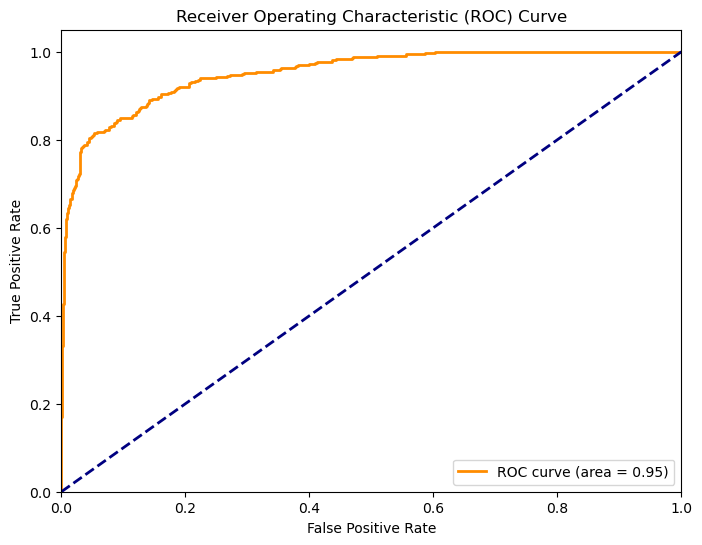

Validation Loss: 0.2705940008163452
Validation Accuracy: 0.8982142806053162
Test Loss: 0.28045377135276794
Test Accuracy: 0.8708333373069763
ROC AUC: 0.9514569588001647
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [20]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [21]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9120 - loss: 0.2285 - val_accuracy: 0.8857 - val_loss: 0.2809
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9051 - loss: 0.2273 - val_accuracy: 0.8893 - val_loss: 0.2730
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9175 - loss: 0.2096 - val_accuracy: 0.8964 - val_loss: 0.2733
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9193 - loss: 0.2005 - val_accuracy: 0.8875 - val_loss: 0.2763
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9451 - loss: 0.1631 - val_accuracy: 0.8946 - val_loss: 0.2923
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9315 - loss: 0.1707 - val_accuracy: 0.8964 - val_loss: 0.2931
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9408 - loss: 0.1554 - val_accuracy: 0.8714 - val_loss: 0.3488
Training Time: 503.8856568336487 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 784ms/step
Inference Time: 14.348315715789795 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step


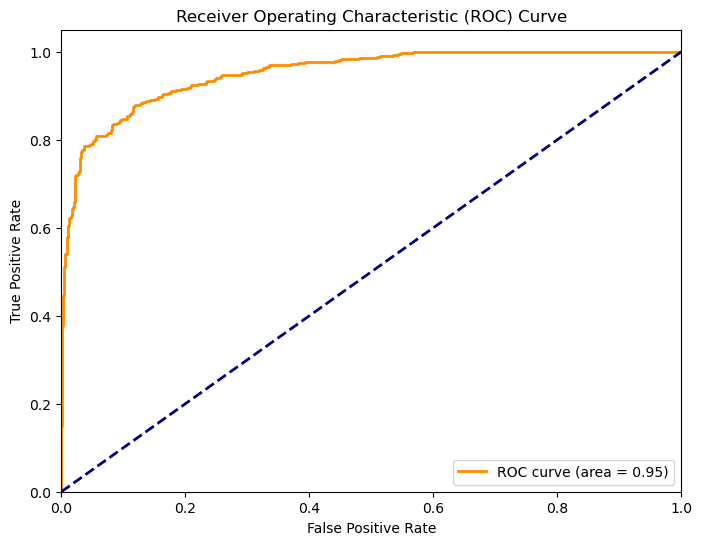

Validation Loss: 0.2730499505996704
Validation Accuracy: 0.8892857432365417
Test Loss: 0.28683608770370483
Test Accuracy: 0.875
ROC AUC: 0.9509089998776133
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [22]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [23]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9158 - loss: 0.2049 - val_accuracy: 0.8893 - val_loss: 0.2831
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9334 - loss: 0.1683 - val_accuracy: 0.8393 - val_loss: 0.3638
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9370 - loss: 0.1739 - val_accuracy: 0.8875 - val_loss: 0.2726
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9378 - loss: 0.1543 - val_accuracy: 0.8893 - val_loss: 0.2768
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9506 - loss: 0.1362 - val_accuracy: 0.8786 - val_loss: 0.3112
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9443 - loss: 0.1479 - val_accuracy: 0.8857 - val_loss: 0.2801
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9615 - loss: 0.1213 - val_accuracy: 0.8893 - val_loss: 0.2904
Epoch 8/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9592 - loss: 0.1023 - val_accuracy: 0.8821 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 786ms/step
Inference Time: 14.37747597694397 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 802ms/step


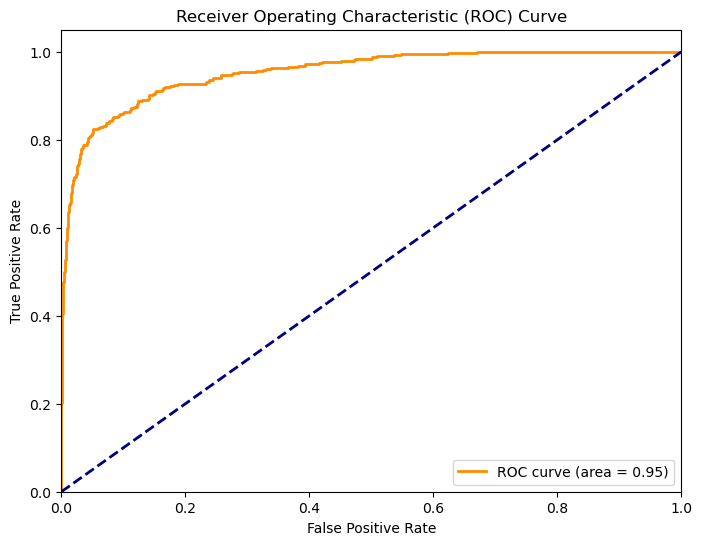

Validation Loss: 0.2726473808288574
Validation Accuracy: 0.887499988079071
Test Loss: 0.2862376570701599
Test Accuracy: 0.878333330154419
ROC AUC: 0.9532204408148733
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [25]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9315 - loss: 0.1799 - val_accuracy: 0.8875 - val_loss: 0.2922
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9467 - loss: 0.1352 - val_accuracy: 0.8893 - val_loss: 0.3085
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9509 - loss: 0.1412 - val_accuracy: 0.8875 - val_loss: 0.2939
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9454 - loss: 0.1312 - val_accuracy: 0.8982 - val_loss: 0.2953
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9613 - loss: 0.1073 - val_accuracy: 0.8518 - val_loss: 0.3951
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9652 - loss: 0.1064 - val_accuracy: 0.8554 - val_loss: 0.4058
Training Time: 432.2639353275299 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 786ms/step
Inference Time: 14.365869045257568 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


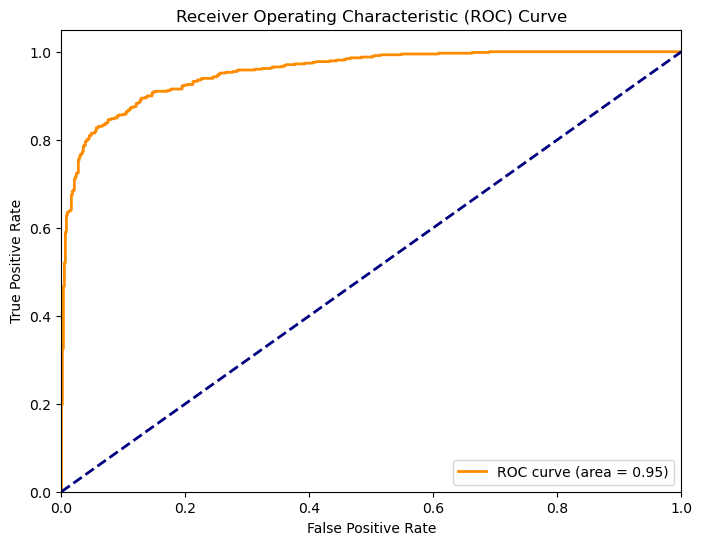

Validation Loss: 0.29219111800193787
Validation Accuracy: 0.887499988079071
Test Loss: 0.29626303911209106
Test Accuracy: 0.8799999952316284
ROC AUC: 0.9544262285962237
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [26]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(2)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Dropout(1)+Dense(1)

In [27]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)

# Add dense layer
x = Dense(512, activation='relu')(x)

# Add dropout layer
x = Dropout(0.5)(x)  # Adding dropout with rate 0.5

predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_6    │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_6… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_7    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_7… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,814,401 (79.40 MB)

 Trainable params: 2,492,417 (9.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [28]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step - accuracy: 0.6084 - loss: 0.6546 - val_accuracy: 0.8571 - val_loss: 0.4110
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8038 - loss: 0.4322 - val_accuracy: 0.8625 - val_loss: 0.3459
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8493 - loss: 0.3398 - val_accuracy: 0.8768 - val_loss: 0.3056
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8757 - loss: 0.3105 - val_accuracy: 0.8804 - val_loss: 0.2926
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8785 - loss: 0.2833 - val_accuracy: 0.8893 - val_loss: 0.2878
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8912 - loss: 0.2406 - val_accuracy: 0.8946 - val_loss: 0.2747
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8973 - loss: 0.2476 - val_accuracy: 0.8857 - val_loss: 0.2735
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9086 - loss: 0.2248 - val_accuracy: 0.8786 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 19s 941ms/step
Inference Time: 18.70913791656494 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 802ms/step


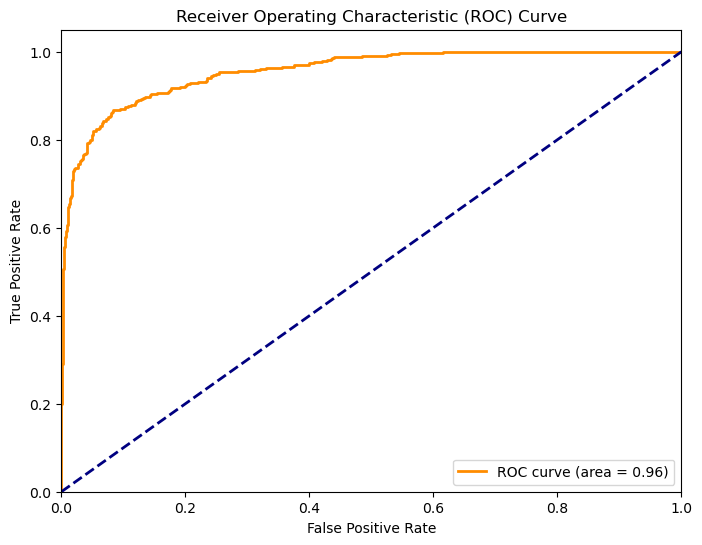

Validation Loss: 0.265250563621521
Validation Accuracy: 0.8928571343421936
Test Loss: 0.268930047750473
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9551730660109703
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [29]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [30]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9359 - loss: 0.1751 - val_accuracy: 0.8911 - val_loss: 0.2681
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9396 - loss: 0.1582 - val_accuracy: 0.9018 - val_loss: 0.2652
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9361 - loss: 0.1495 - val_accuracy: 0.8804 - val_loss: 0.2846
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9538 - loss: 0.1381 - val_accuracy: 0.8875 - val_loss: 0.2764
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9537 - loss: 0.1307 - val_accuracy: 0.9000 - val_loss: 0.2745
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9585 - loss: 0.1144 - val_accuracy: 0.8929 - val_loss: 0.2782
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9656 - loss: 0.1083 - val_accuracy: 0.8768 - val_loss: 0.3225
Training Time: 503.0868444442749 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 789ms/step
Inference Time: 14.43112063407898 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 804ms/step


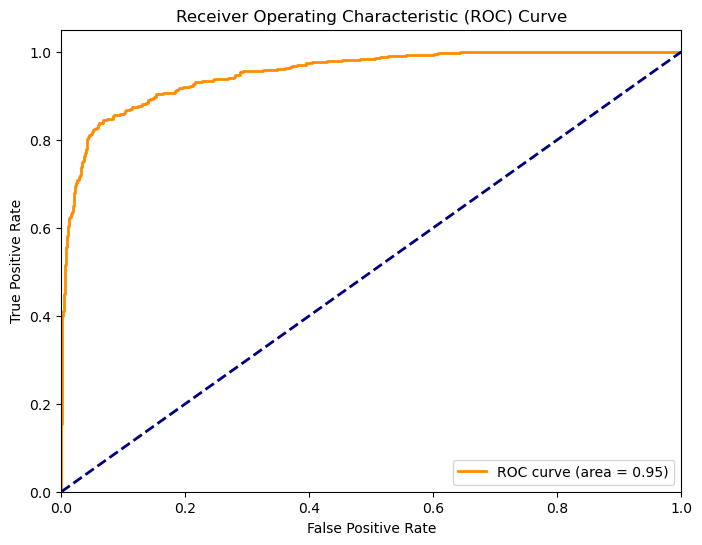

Validation Loss: 0.2652314007282257
Validation Accuracy: 0.9017857313156128
Test Loss: 0.2893392741680145
Test Accuracy: 0.8758333325386047
ROC AUC: 0.9510452942289077
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [31]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [32]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.9399 - loss: 0.1649 - val_accuracy: 0.8821 - val_loss: 0.3013
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9415 - loss: 0.1453 - val_accuracy: 0.8911 - val_loss: 0.2698
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9515 - loss: 0.1398 - val_accuracy: 0.8768 - val_loss: 0.3323
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9544 - loss: 0.1196 - val_accuracy: 0.8643 - val_loss: 0.3422
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9597 - loss: 0.1151 - val_accuracy: 0.8982 - val_loss: 0.2794
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9541 - loss: 0.1173 - val_accuracy: 0.8929 - val_loss: 0.2915
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9765 - loss: 0.0827 - val_accuracy: 0.8804 - val_loss: 0.3233
Training Time: 504.78810453414917 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 786ms/step
Inference Time: 14.381937742233276 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 804ms/step


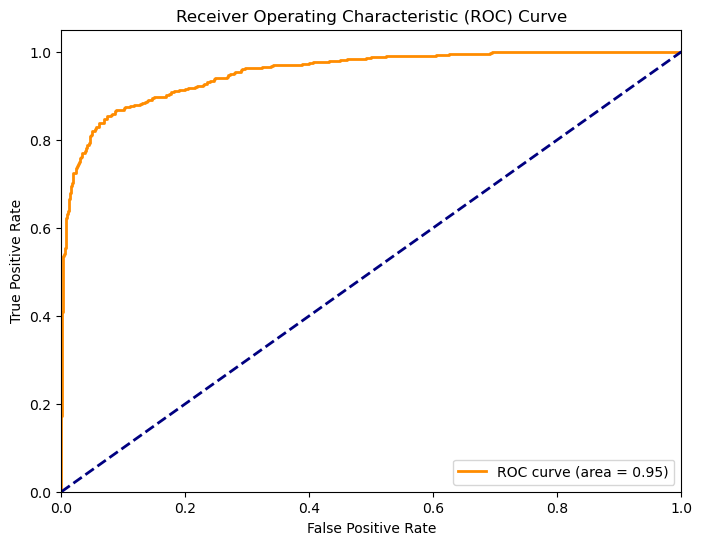

Validation Loss: 0.2698329985141754
Validation Accuracy: 0.8910714387893677
Test Loss: 0.28199028968811035
Test Accuracy: 0.8899999856948853
ROC AUC: 0.9529784488033912
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [33]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [34]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9585 - loss: 0.1304 - val_accuracy: 0.8857 - val_loss: 0.2810
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9645 - loss: 0.1261 - val_accuracy: 0.8857 - val_loss: 0.2845
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9687 - loss: 0.1040 - val_accuracy: 0.8804 - val_loss: 0.3090
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9697 - loss: 0.1047 - val_accuracy: 0.8750 - val_loss: 0.3456
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9633 - loss: 0.0969 - val_accuracy: 0.8929 - val_loss: 0.2941
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9702 - loss: 0.0794 - val_accuracy: 0.8857 - val_loss: 0.2988
Training Time: 431.14845180511475 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 788ms/step
Inference Time: 14.400290727615356 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


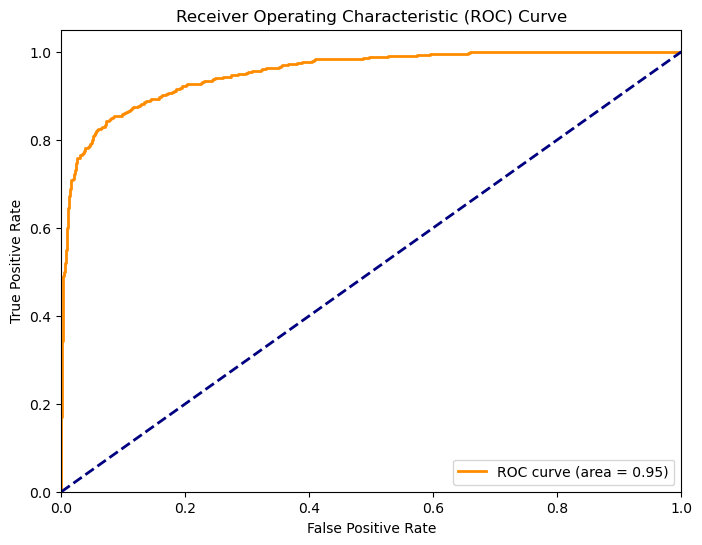

Validation Loss: 0.2810019552707672
Validation Accuracy: 0.8857142925262451
Test Loss: 0.2934645712375641
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9525667842321344
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [35]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Dropout(1)+Dense(1)'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+GlobalAveragePooling+Dense

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add custom classification head
x = base_model.output

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add additional dense layer
x = Dense(1024, activation='relu')(x)

# Add one more dense layer if needed
# x = Dense(512, activation='relu')(x)

# Add final prediction layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Combine base model and custom classification head
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,290,113 (77.40 MB)

 Trainable params: 1,968,129 (7.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [8]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 79s 1s/step - accuracy: 0.6229 - loss: 0.6399 - val_accuracy: 0.8179 - val_loss: 0.4344
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8396 - loss: 0.3878 - val_accuracy: 0.8875 - val_loss: 0.3533
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8746 - loss: 0.3239 - val_accuracy: 0.8518 - val_loss: 0.3422
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8854 - loss: 0.3025 - val_accuracy: 0.8536 - val_loss: 0.3454
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8740 - loss: 0.3008 - val_accuracy: 0.8536 - val_loss: 0.3296
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8959 - loss: 0.2721 - val_accuracy: 0.8821 - val_loss: 0.2961
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9053 - loss: 0.2535 - val_accuracy: 0.8696 - val_loss: 0.3027
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8987 - loss: 0.2596 - val_accuracy: 0.8839 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 906ms/step
Inference Time: 18.17799139022827 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 812ms/step


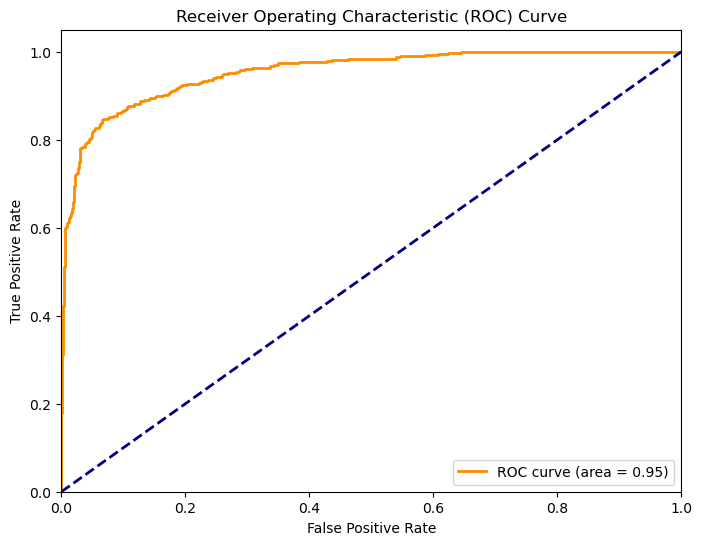

Validation Loss: 0.2671079635620117
Validation Accuracy: 0.887499988079071
Test Loss: 0.2747710347175598
Test Accuracy: 0.8849999904632568
ROC AUC: 0.9530424237029785
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [9]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [10]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9361 - loss: 0.1738 - val_accuracy: 0.8893 - val_loss: 0.2712
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9516 - loss: 0.1548 - val_accuracy: 0.8804 - val_loss: 0.2749
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9415 - loss: 0.1605 - val_accuracy: 0.8857 - val_loss: 0.2890
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9500 - loss: 0.1539 - val_accuracy: 0.8821 - val_loss: 0.2828
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9529 - loss: 0.1452 - val_accuracy: 0.8679 - val_loss: 0.2837
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9536 - loss: 0.1472 - val_accuracy: 0.8839 - val_loss: 0.2758
Training Time: 432.358286857605 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 792ms/step
Inference Time: 14.491519451141357 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 803ms/step


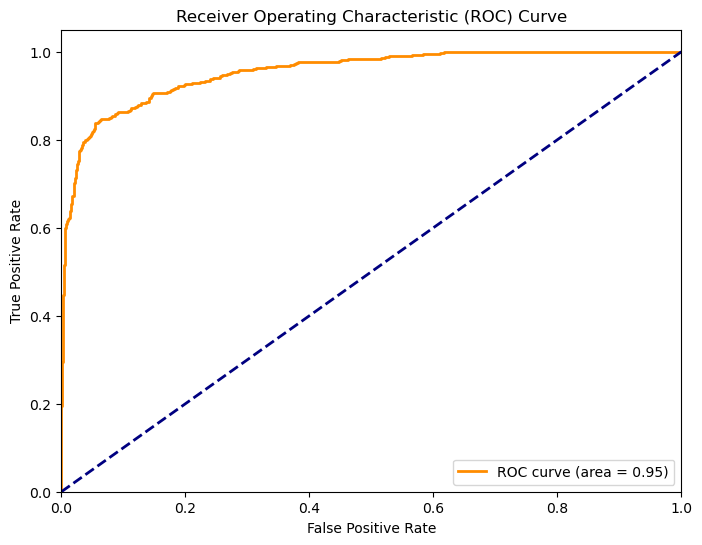

Validation Loss: 0.2712450325489044
Validation Accuracy: 0.8892857432365417
Test Loss: 0.27551040053367615
Test Accuracy: 0.8766666650772095
ROC AUC: 0.9536877357335976
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [11]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [12]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9363 - loss: 0.1643 - val_accuracy: 0.8911 - val_loss: 0.2661
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9385 - loss: 0.1601 - val_accuracy: 0.8929 - val_loss: 0.2724
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9483 - loss: 0.1576 - val_accuracy: 0.8839 - val_loss: 0.2788
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9523 - loss: 0.1480 - val_accuracy: 0.8804 - val_loss: 0.2758
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9539 - loss: 0.1445 - val_accuracy: 0.8732 - val_loss: 0.2745
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9479 - loss: 0.1452 - val_accuracy: 0.8911 - val_loss: 0.2724
Training Time: 432.4648678302765 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 788ms/step
Inference Time: 14.418503046035767 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 802ms/step


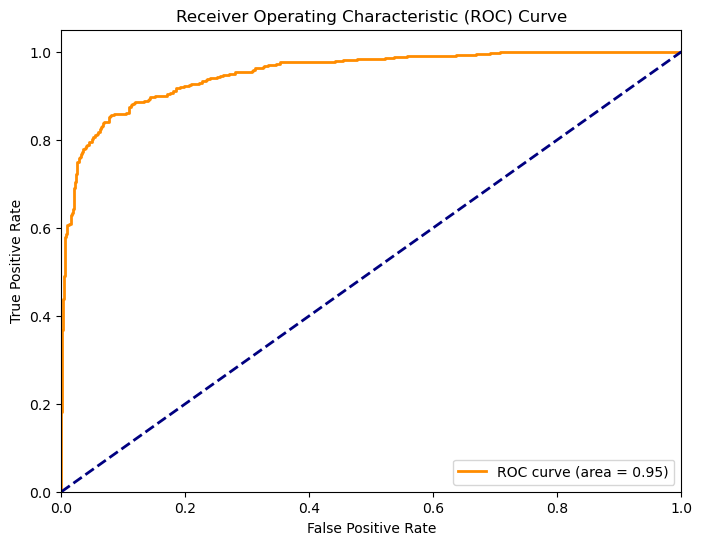

Validation Loss: 0.2660630941390991
Validation Accuracy: 0.8910714387893677
Test Loss: 0.27898335456848145
Test Accuracy: 0.8883333206176758
ROC AUC: 0.9519214722015152
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [13]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [14]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9454 - loss: 0.1556 - val_accuracy: 0.8911 - val_loss: 0.2694
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9513 - loss: 0.1459 - val_accuracy: 0.8982 - val_loss: 0.2668
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9558 - loss: 0.1448 - val_accuracy: 0.8929 - val_loss: 0.2706
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9538 - loss: 0.1459 - val_accuracy: 0.8857 - val_loss: 0.2756
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9557 - loss: 0.1387 - val_accuracy: 0.8946 - val_loss: 0.2733
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9675 - loss: 0.1270 - val_accuracy: 0.8446 - val_loss: 0.3222
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9558 - loss: 0.1350 - val_accuracy: 0.8929 - val_loss: 0.2694
Training Time: 503.6256148815155 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 786ms/step
Inference Time: 14.37761664390564 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


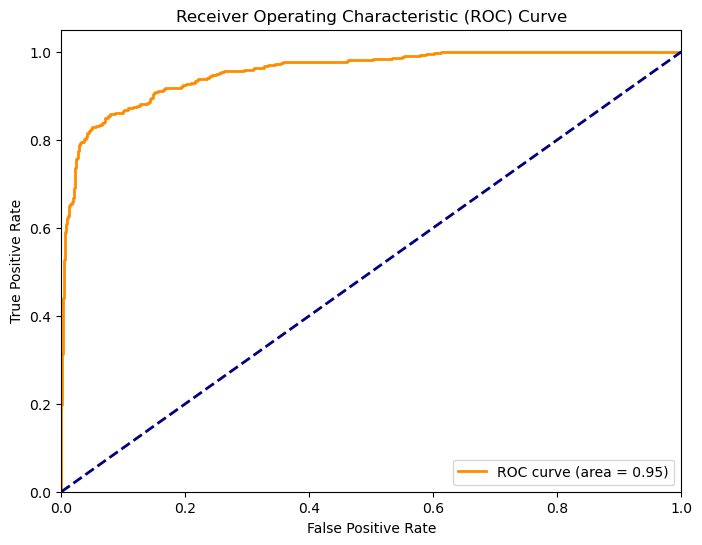

Validation Loss: 0.26679205894470215
Validation Accuracy: 0.8982142806053162
Test Loss: 0.2706405818462372
Test Accuracy: 0.8891666531562805
ROC AUC: 0.9547391493007266
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [15]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+GlobalAveragePooling+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense

In [16]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Conv2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Add additional layers
x = base_model.output

# Add Conv2D layer
x = Conv2D(64, (3, 3), activation='relu')(x)

# Add GlobalAveragePooling2D layer
x = GlobalAveragePooling2D()(x)

# Add Dropout layer
x = Dropout(0.5)(x)

# Add Dense layer
x = Dense(1024, activation='relu')(x)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 19,495,553 (74.37 MB)

 Trainable params: 1,173,569 (4.48 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [17]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.6209 - loss: 0.6314 - val_accuracy: 0.8321 - val_loss: 0.4043
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8168 - loss: 0.4190 - val_accuracy: 0.8518 - val_loss: 0.3386
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8269 - loss: 0.3949 - val_accuracy: 0.8661 - val_loss: 0.3122
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8579 - loss: 0.3393 - val_accuracy: 0.8714 - val_loss: 0.3060
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8849 - loss: 0.3027 - val_accuracy: 0.8804 - val_loss: 0.2987
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8784 - loss: 0.2865 - val_accuracy: 0.8768 - val_loss: 0.2866
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8889 - loss: 0.2764 - val_accuracy: 0.8679 - val_loss: 0.3045
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8922 - loss: 0.2748 - val_accuracy: 0.8786 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 938ms/step
Inference Time: 18.66442084312439 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 806ms/step


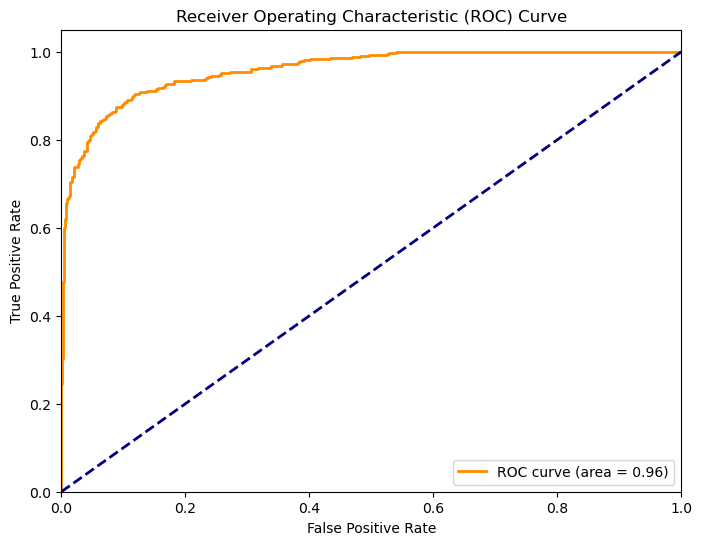

Validation Loss: 0.2759881019592285
Validation Accuracy: 0.887499988079071
Test Loss: 0.259838342666626
Test Accuracy: 0.8924999833106995
ROC AUC: 0.9582299536042902
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [18]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [19]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9199 - loss: 0.2014 - val_accuracy: 0.8750 - val_loss: 0.3032
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9213 - loss: 0.2059 - val_accuracy: 0.8857 - val_loss: 0.2832
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9197 - loss: 0.1896 - val_accuracy: 0.8893 - val_loss: 0.2762
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9284 - loss: 0.1766 - val_accuracy: 0.8732 - val_loss: 0.3065
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9261 - loss: 0.1763 - val_accuracy: 0.8839 - val_loss: 0.2833
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.9395 - loss: 0.1790 - val_accuracy: 0.8839 - val_loss: 0.2920
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9312 - loss: 0.1634 - val_accuracy: 0.8821 - val_loss: 0.3049
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9402 - loss: 0.1558 - val_accuracy: 0.8857 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 790ms/step
Inference Time: 14.449994087219238 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 805ms/step


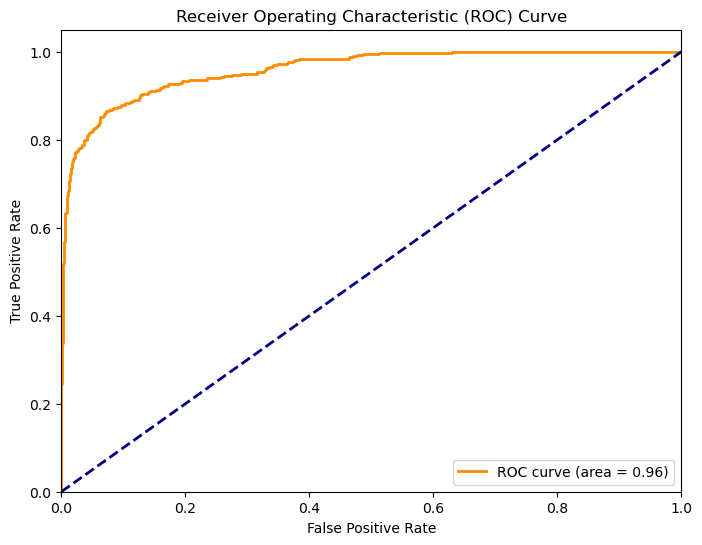

Validation Loss: 0.27617135643959045
Validation Accuracy: 0.8892857432365417
Test Loss: 0.2604465186595917
Test Accuracy: 0.887499988079071
ROC AUC: 0.9587862570789617
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [20]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [21]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.9344 - loss: 0.1801 - val_accuracy: 0.8768 - val_loss: 0.2998
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9263 - loss: 0.1965 - val_accuracy: 0.8821 - val_loss: 0.2929
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9282 - loss: 0.1778 - val_accuracy: 0.8911 - val_loss: 0.3131
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9415 - loss: 0.1686 - val_accuracy: 0.9018 - val_loss: 0.2780
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9464 - loss: 0.1472 - val_accuracy: 0.8661 - val_loss: 0.2953
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9486 - loss: 0.1463 - val_accuracy: 0.8911 - val_loss: 0.3348
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9484 - loss: 0.1362 - val_accuracy: 0.8911 - val_loss: 0.3115
Epoch 8/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9544 - loss: 0.1184 - val_accuracy: 0.8929 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 794ms/step
Inference Time: 14.496589660644531 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 803ms/step


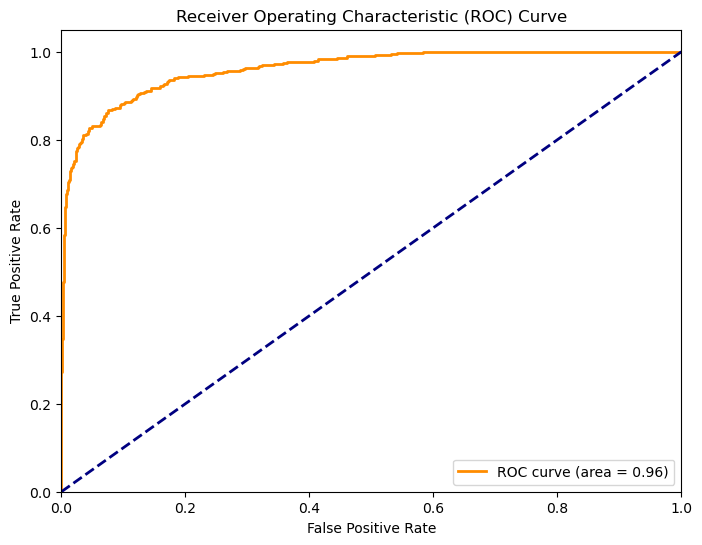

Validation Loss: 0.27800053358078003
Validation Accuracy: 0.9017857313156128
Test Loss: 0.25808945298194885
Test Accuracy: 0.8933333158493042
ROC AUC: 0.9607861680704057
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [22]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [23]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9568 - loss: 0.1281 - val_accuracy: 0.8643 - val_loss: 0.3158
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9445 - loss: 0.1466 - val_accuracy: 0.8857 - val_loss: 0.3050
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9377 - loss: 0.1547 - val_accuracy: 0.8929 - val_loss: 0.3137
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9475 - loss: 0.1474 - val_accuracy: 0.8911 - val_loss: 0.3055
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9508 - loss: 0.1362 - val_accuracy: 0.8911 - val_loss: 0.3060
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9645 - loss: 0.1104 - val_accuracy: 0.8946 - val_loss: 0.3206
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9606 - loss: 0.1103 - val_accuracy: 0.8839 - val_loss: 0.3313
Training Time: 505.6362097263336 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 792ms/step
Inference Time: 14.487502098083496 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 803ms/step


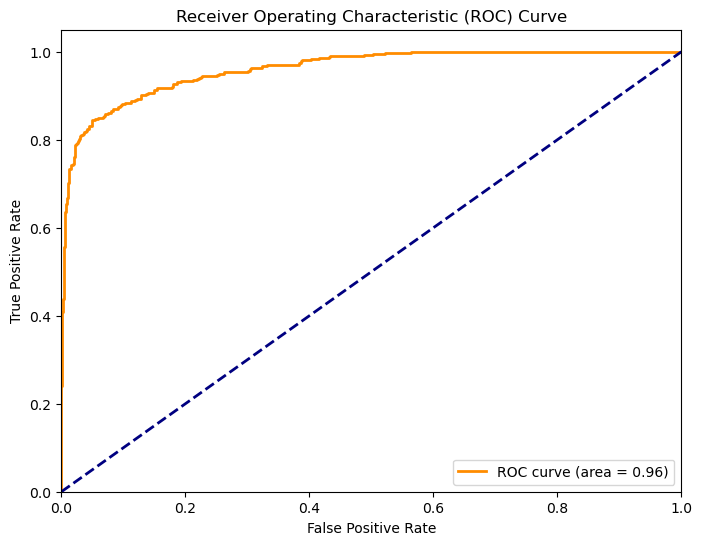

Validation Loss: 0.30495160818099976
Validation Accuracy: 0.8857142925262451
Test Loss: 0.27705106139183044
Test Accuracy: 0.8949999809265137
ROC AUC: 0.9602910579779481
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [24]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Conv2D+GlobalAveragePooling+Dropout+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+LSTM+Dense

In [26]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, LSTM, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Global average pooling
x = GlobalAveragePooling2D()(x)

# Reshape to fit LSTM input
x = Reshape((1, -1))(x)

# LSTM layer
x = LSTM(64)(x)

# Dense layer
x = Dense(1024, activation='relu')(x)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_8    │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_8… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_9    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_9… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 18,897,729 (72.09 MB)

 Trainable params: 575,745 (2.20 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [27]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.5801 - loss: 0.6768 - val_accuracy: 0.7804 - val_loss: 0.5825
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.7840 - loss: 0.5209 - val_accuracy: 0.8554 - val_loss: 0.3810
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.8630 - loss: 0.3482 - val_accuracy: 0.8643 - val_loss: 0.3366
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8567 - loss: 0.3318 - val_accuracy: 0.8589 - val_loss: 0.3364
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8713 - loss: 0.2944 - val_accuracy: 0.8714 - val_loss: 0.3037
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8735 - loss: 0.2946 - val_accuracy: 0.8607 - val_loss: 0.3129
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.8773 - loss: 0.2839 - val_accuracy: 0.8679 - val_loss: 0.3025
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.8865 - loss: 0.2565 - val_accuracy: 0.8643 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 904ms/step
Inference Time: 18.243757486343384 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 803ms/step


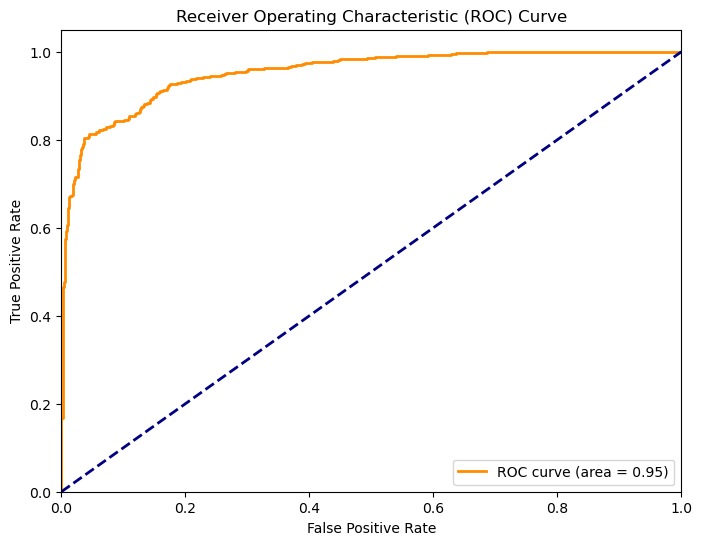

Validation Loss: 0.2724151611328125
Validation Accuracy: 0.8803571462631226
Test Loss: 0.2797490358352661
Test Accuracy: 0.8708333373069763
ROC AUC: 0.9522274391125847
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [28]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [29]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.9266 - loss: 0.1958 - val_accuracy: 0.8804 - val_loss: 0.2731
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9274 - loss: 0.1800 - val_accuracy: 0.8786 - val_loss: 0.2838
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9271 - loss: 0.1827 - val_accuracy: 0.8964 - val_loss: 0.2791
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9371 - loss: 0.1661 - val_accuracy: 0.8804 - val_loss: 0.2813
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9362 - loss: 0.1642 - val_accuracy: 0.8839 - val_loss: 0.2808
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9532 - loss: 0.1451 - val_accuracy: 0.8821 - val_loss: 0.2857
Training Time: 431.1401877403259 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 789ms/step
Inference Time: 14.41943907737732 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step


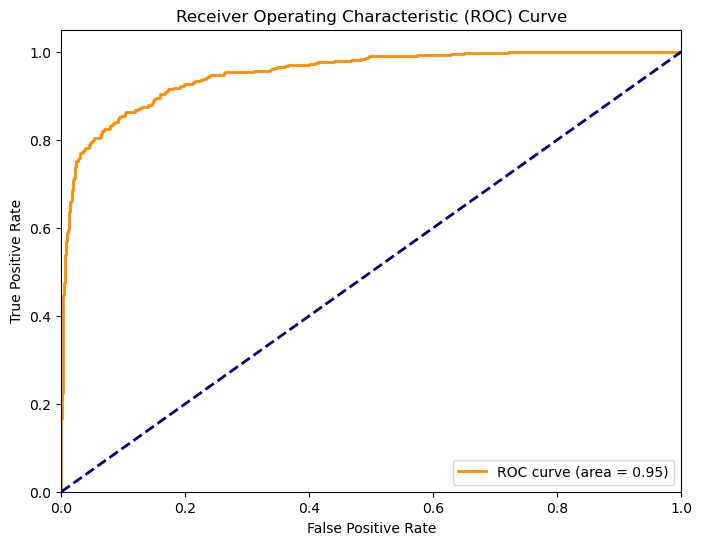

Validation Loss: 0.2730947434902191
Validation Accuracy: 0.8803571462631226
Test Loss: 0.28282907605171204
Test Accuracy: 0.8791666626930237
ROC AUC: 0.9511676809933355
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [30]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [31]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9333 - loss: 0.1892 - val_accuracy: 0.8804 - val_loss: 0.2793
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9277 - loss: 0.1860 - val_accuracy: 0.8875 - val_loss: 0.2784
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9281 - loss: 0.1809 - val_accuracy: 0.8804 - val_loss: 0.2892
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9387 - loss: 0.1569 - val_accuracy: 0.8857 - val_loss: 0.2788
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9331 - loss: 0.1745 - val_accuracy: 0.8857 - val_loss: 0.3036
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9389 - loss: 0.1640 - val_accuracy: 0.8732 - val_loss: 0.2876
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9452 - loss: 0.1511 - val_accuracy: 0.8857 - val_loss: 0.2873
Training Time: 501.75365805625916 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 787ms/step
Inference Time: 14.381300449371338 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 801ms/step


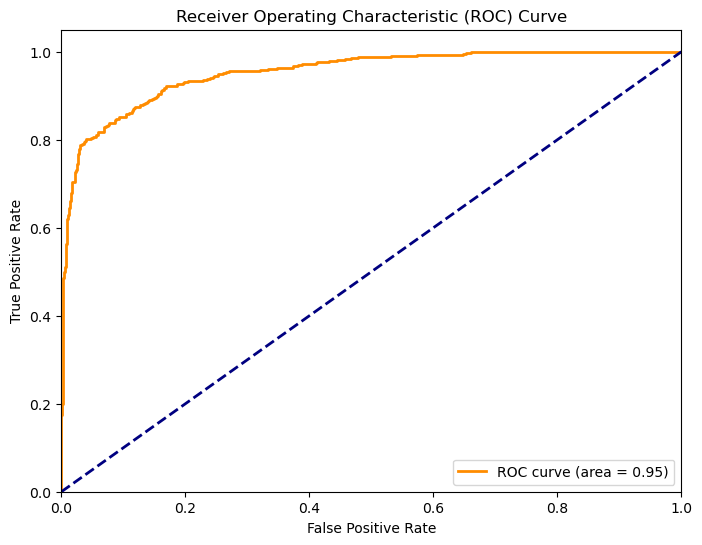

Validation Loss: 0.2784402370452881
Validation Accuracy: 0.887499988079071
Test Loss: 0.28497785329818726
Test Accuracy: 0.8733333349227905
ROC AUC: 0.9526363221664684
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [32]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [33]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9423 - loss: 0.1636 - val_accuracy: 0.8607 - val_loss: 0.3156
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9383 - loss: 0.1737 - val_accuracy: 0.8821 - val_loss: 0.2849
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9500 - loss: 0.1531 - val_accuracy: 0.8911 - val_loss: 0.2807
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9431 - loss: 0.1544 - val_accuracy: 0.8304 - val_loss: 0.3868
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9315 - loss: 0.1621 - val_accuracy: 0.8875 - val_loss: 0.2861
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9614 - loss: 0.1318 - val_accuracy: 0.8929 - val_loss: 0.2939
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9512 - loss: 0.1381 - val_accuracy: 0.8911 - val_loss: 0.3059
Epoch 8/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9481 - loss: 0.1387 - val_accuracy: 0.8696 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 787ms/step
Inference Time: 14.381427764892578 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 802ms/step


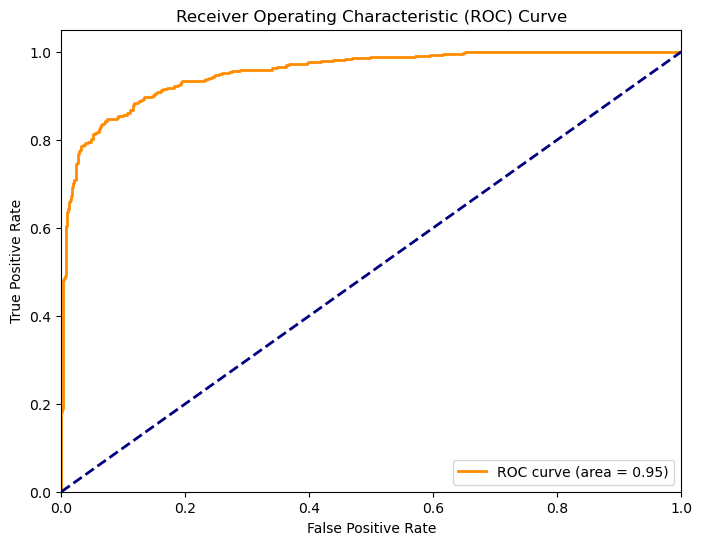

Validation Loss: 0.28071659803390503
Validation Accuracy: 0.8910714387893677
Test Loss: 0.2827979028224945
Test Accuracy: 0.878333330154419
ROC AUC: 0.9536599205598637
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [34]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+LSTM+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+GRU+Dense

In [7]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, GRU, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Global average pooling
x = GlobalAveragePooling2D()(x)

# Reshape to fit GRU input
x = Reshape((1, -1))(x)

# GRU layer
x = GRU(64)(x)

# Dense layer
x = Dense(1024, activation='relu')(x)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 18,770,881 (71.61 MB)

 Trainable params: 448,897 (1.71 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [37]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 78s 1s/step - accuracy: 0.6432 - loss: 0.6620 - val_accuracy: 0.7661 - val_loss: 0.5432
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.7806 - loss: 0.4982 - val_accuracy: 0.8375 - val_loss: 0.4033
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8417 - loss: 0.3875 - val_accuracy: 0.8089 - val_loss: 0.4007
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8618 - loss: 0.3195 - val_accuracy: 0.8679 - val_loss: 0.3203
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8793 - loss: 0.2938 - val_accuracy: 0.8554 - val_loss: 0.3124
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8790 - loss: 0.2980 - val_accuracy: 0.8661 - val_loss: 0.2956
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8927 - loss: 0.2739 - val_accuracy: 0.8732 - val_loss: 0.2946
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.8919 - loss: 0.2629 - val_accuracy: 0.8679 - val_loss:

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 902ms/step
Inference Time: 18.171072483062744 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 804ms/step


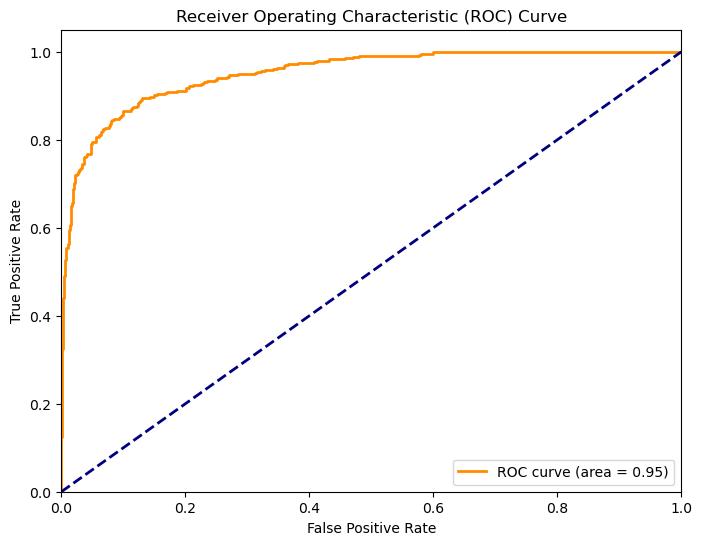

Validation Loss: 0.27833500504493713
Validation Accuracy: 0.8892857432365417
Test Loss: 0.29086819291114807
Test Accuracy: 0.8816666603088379
ROC AUC: 0.9506836969703713
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [38]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [39]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9312 - loss: 0.1812 - val_accuracy: 0.8732 - val_loss: 0.2809
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9328 - loss: 0.1744 - val_accuracy: 0.8786 - val_loss: 0.2808
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9334 - loss: 0.1811 - val_accuracy: 0.8768 - val_loss: 0.2819
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9264 - loss: 0.1792 - val_accuracy: 0.8839 - val_loss: 0.2870
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9325 - loss: 0.1698 - val_accuracy: 0.8768 - val_loss: 0.2917
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9395 - loss: 0.1511 - val_accuracy: 0.8875 - val_loss: 0.2851
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9363 - loss: 0.1637 - val_accuracy: 0.8804 - val_loss: 0.2835
Training Time: 502.3932409286499 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 793ms/step
Inference Time: 14.470999717712402 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 799ms/step


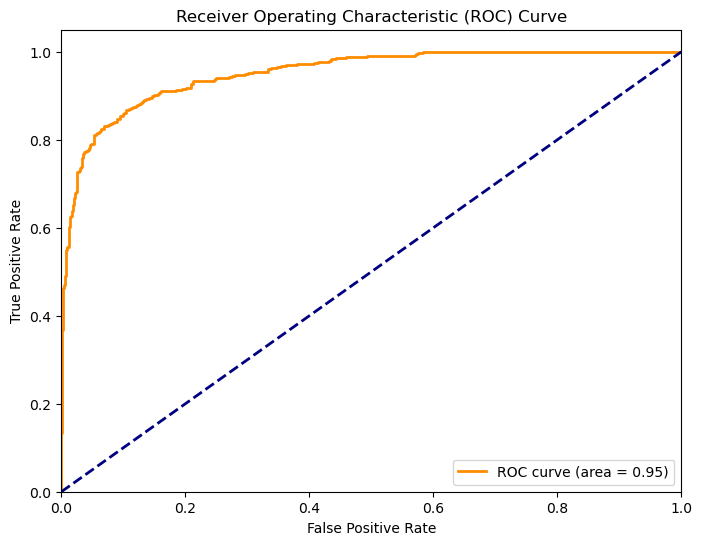

Validation Loss: 0.2807907164096832
Validation Accuracy: 0.8785714507102966
Test Loss: 0.28995606303215027
Test Accuracy: 0.8791666626930237
ROC AUC: 0.9508533695301461
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [40]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [41]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9279 - loss: 0.1792 - val_accuracy: 0.8875 - val_loss: 0.2797
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9397 - loss: 0.1707 - val_accuracy: 0.8821 - val_loss: 0.2832
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9433 - loss: 0.1584 - val_accuracy: 0.8911 - val_loss: 0.2855
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9388 - loss: 0.1558 - val_accuracy: 0.8804 - val_loss: 0.2912
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 71s 1s/step - accuracy: 0.9387 - loss: 0.1618 - val_accuracy: 0.8804 - val_loss: 0.2896
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9525 - loss: 0.1436 - val_accuracy: 0.8875 - val_loss: 0.2870
Training Time: 430.84569334983826 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 790ms/step
Inference Time: 14.43607473373413 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 802ms/step


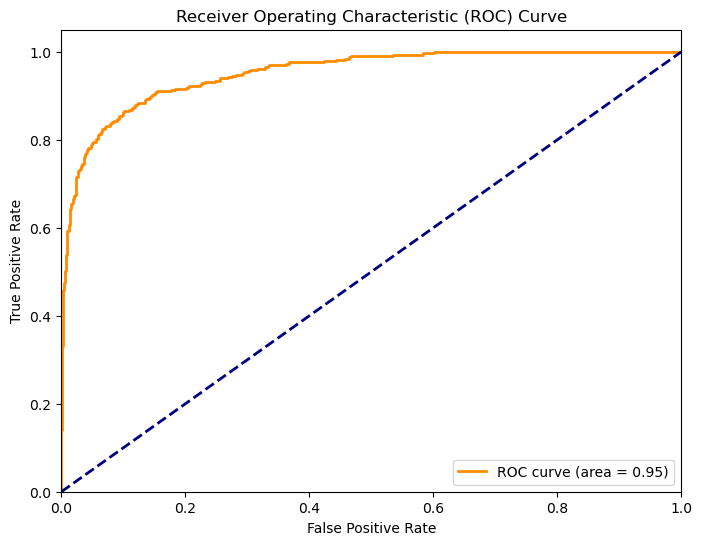

Validation Loss: 0.2797069549560547
Validation Accuracy: 0.887499988079071
Test Loss: 0.2894410490989685
Test Accuracy: 0.8791666626930237
ROC AUC: 0.9514013284526975
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [42]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [43]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9329 - loss: 0.1638 - val_accuracy: 0.8750 - val_loss: 0.2864
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9372 - loss: 0.1713 - val_accuracy: 0.8839 - val_loss: 0.2922
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9324 - loss: 0.1524 - val_accuracy: 0.8893 - val_loss: 0.2841
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9357 - loss: 0.1703 - val_accuracy: 0.8911 - val_loss: 0.2899
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9397 - loss: 0.1507 - val_accuracy: 0.8714 - val_loss: 0.3038
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9481 - loss: 0.1357 - val_accuracy: 0.8714 - val_loss: 0.2984
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9525 - loss: 0.1359 - val_accuracy: 0.8804 - val_loss: 0.2960
Epoch 8/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.9575 - loss: 0.1251 - val_accuracy: 0.8786 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 790ms/step
Inference Time: 14.437105655670166 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step


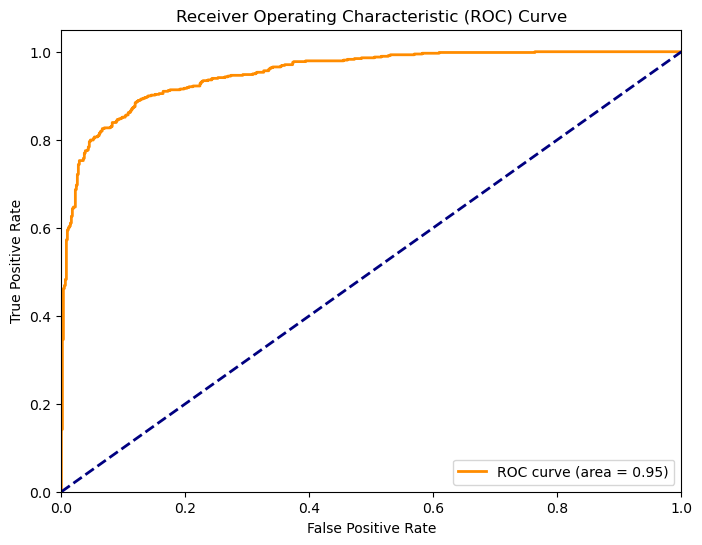

Validation Loss: 0.2841290533542633
Validation Accuracy: 0.8892857432365417
Test Loss: 0.301627516746521
Test Accuracy: 0.8774999976158142
ROC AUC: 0.9510995338176882
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [44]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+GRU+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Attention Mechanism+Dense

In [8]:
import tensorflow as tf
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Attention
from tensorflow.keras.models import Model
from tensorflow.keras.applications import DenseNet201
from tensorflow.keras.optimizers import Adam

# Define custom attention layer
class AttentionLayer(tf.keras.layers.Layer):
    def __init__(self, **kwargs):
        super(AttentionLayer, self).__init__(**kwargs)

    def build(self, input_shape):
        super(AttentionLayer, self).build(input_shape)

    def call(self, inputs):
        x, alpha = inputs
        return tf.reduce_sum(x * tf.expand_dims(alpha, -1), axis=1)

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Global average pooling
x = GlobalAveragePooling2D()(x)

# Dense layer
x = Dense(1024, activation='relu')(x)

# Attention mechanism
alpha = Dense(1, activation='softmax')(x)
context = AttentionLayer()([x, alpha])

# Dense layer after attention
x = Dense(512, activation='relu')(context)

# Output layer
predictions = Dense(1, activation='sigmoid')(x)  # Assuming binary classification

# Model
model = Model(inputs=base_model.input, outputs=predictions)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Summary
model.summary()


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_4    │ (None, 230, 230,  │          0 │ input_layer_2[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_4… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_5    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_5… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 20,815,426 (79.40 MB)

 Trainable params: 2,493,442 (9.51 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [46]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50


/home/lab4/.local/lib/python3.10/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (32, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 0s 827ms/step - accuracy: 0.5167 - loss: 2.6400

/home/lab4/.local/lib/python3.10/site-packages/keras/src/ops/nn.py:545: UserWarning: You are using a softmax over axis -1 of a tensor of shape (None, 1). This axis has size 1. The softmax operation will always return the value 1, which is likely not what you intended. Did you mean to use a sigmoid instead?
  warnings.warn(


70/70 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - accuracy: 0.5166 - loss: 2.6298 - val_accuracy: 0.4875 - val_loss: 2.2030
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4984 - loss: 1.5041 - val_accuracy: 0.4875 - val_loss: 2.3764
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5111 - loss: 1.6859 - val_accuracy: 0.5125 - val_loss: 1.5318
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4972 - loss: 1.2044 - val_accuracy: 0.5268 - val_loss: 0.7371
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5236 - loss: 0.9389 - val_accuracy: 0.4875 - val_loss: 1.3604
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5065 - loss: 1.0012 - val_accuracy: 0.5125 - val_loss: 1.2562
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5125 - loss: 1.0574 - val_accuracy: 0.4875 - val_loss: 0.7641
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5114 - loss: 0.8754 - val_accuracy: 0.5304 - val_loss: 0.7178
Epo

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 894ms/step
Inference Time: 17.954575538635254 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 805ms/step


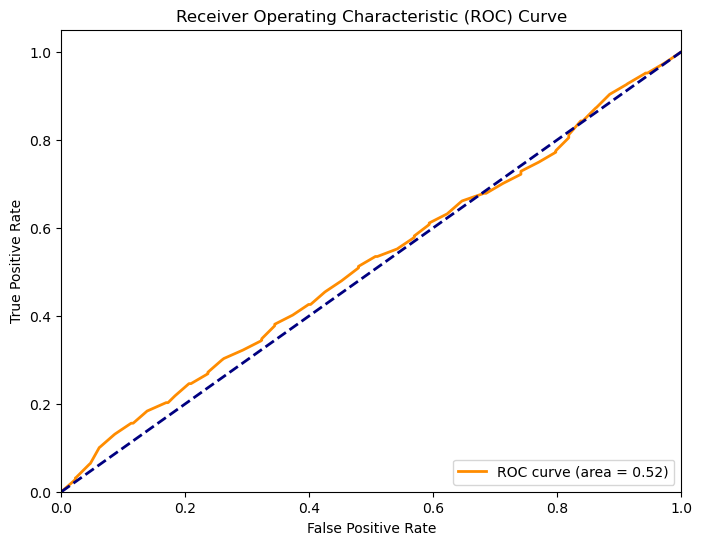

Validation Loss: 0.7178358435630798
Validation Accuracy: 0.5303571224212646
Test Loss: 0.7368977069854736
Test Accuracy: 0.5166666507720947
ROC AUC: 0.5170479199813083
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [47]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [48]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4969 - loss: 0.9198 - val_accuracy: 0.5125 - val_loss: 0.8339
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4654 - loss: 1.0704 - val_accuracy: 0.5125 - val_loss: 2.4611
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 73s 1s/step - accuracy: 0.5187 - loss: 1.2913 - val_accuracy: 0.4875 - val_loss: 1.0822
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5010 - loss: 0.8414 - val_accuracy: 0.5268 - val_loss: 0.6999
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5132 - loss: 0.8539 - val_accuracy: 0.5125 - val_loss: 0.9183
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5137 - loss: 0.7958 - val_accuracy: 0.5125 - val_loss: 0.7316
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5194 - loss: 0.7422 - val_accuracy: 0.5125 - val_loss: 0.7642
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5369 - loss: 0.7310 - val_accuracy: 0.5411 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 788ms/step
Inference Time: 14.40383768081665 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 803ms/step


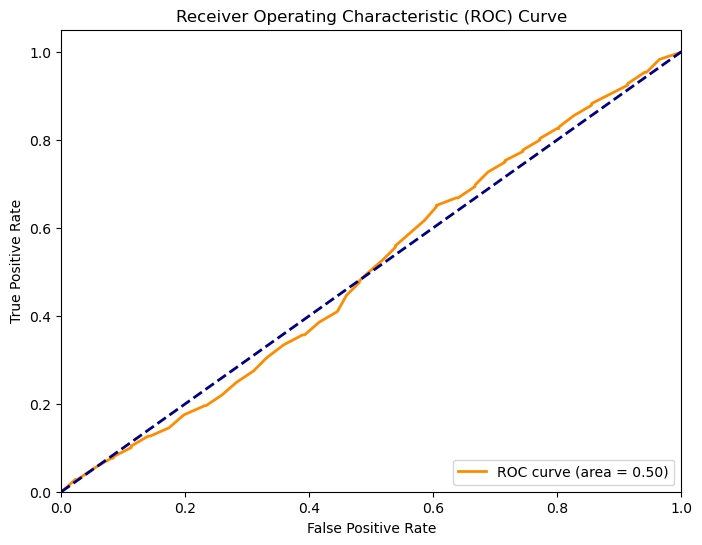

Validation Loss: 0.6999302506446838
Validation Accuracy: 0.5267857313156128
Test Loss: 0.7326699495315552
Test Accuracy: 0.4883333444595337
ROC AUC: 0.5018775242270163
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [49]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [50]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5051 - loss: 0.7586 - val_accuracy: 0.5196 - val_loss: 0.7683
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5299 - loss: 0.8947 - val_accuracy: 0.5054 - val_loss: 0.7015
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5094 - loss: 0.7823 - val_accuracy: 0.5411 - val_loss: 0.7071
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5266 - loss: 0.7381 - val_accuracy: 0.5125 - val_loss: 0.7042
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5075 - loss: 0.9361 - val_accuracy: 0.5232 - val_loss: 0.7394
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5083 - loss: 0.7650 - val_accuracy: 0.4875 - val_loss: 0.8162
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5101 - loss: 0.7905 - val_accuracy: 0.4875 - val_loss: 0.8846
Training Time: 504.0323603153229 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 787ms/step
Inference Time: 14.382606744766235 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 30s 800ms/step


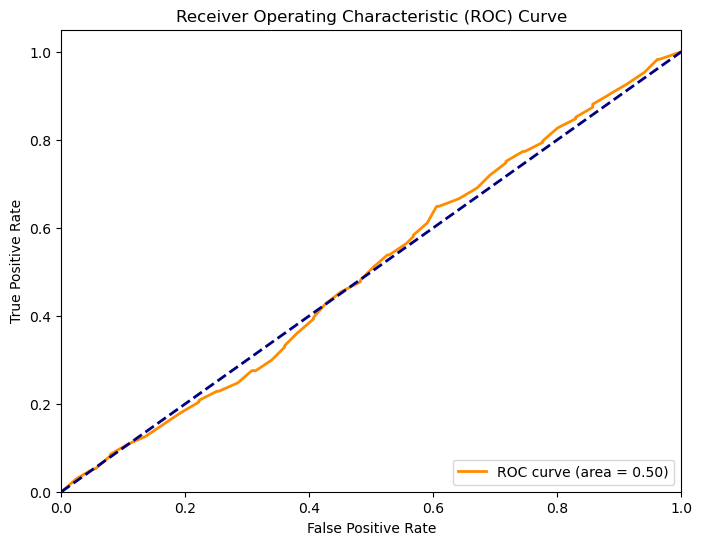

Validation Loss: 0.7015255093574524
Validation Accuracy: 0.5053571462631226
Test Loss: 0.7174698114395142
Test Accuracy: 0.49666666984558105
ROC AUC: 0.5038245863883666
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [51]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [52]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5147 - loss: 0.7665 - val_accuracy: 0.5518 - val_loss: 0.7117
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5124 - loss: 0.8367 - val_accuracy: 0.5054 - val_loss: 0.7386
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4896 - loss: 0.9329 - val_accuracy: 0.5125 - val_loss: 0.7939
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4918 - loss: 0.9582 - val_accuracy: 0.5125 - val_loss: 0.9654
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5075 - loss: 0.8181 - val_accuracy: 0.4875 - val_loss: 0.8414
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5044 - loss: 0.7358 - val_accuracy: 0.5375 - val_loss: 0.7109
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.4867 - loss: 0.8147 - val_accuracy: 0.5089 - val_loss: 0.7321
Epoch 8/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 72s 1s/step - accuracy: 0.5391 - loss: 0.7936 - val_accuracy: 0.4875 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 14s 794ms/step
Inference Time: 14.50573444366455 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 31s 803ms/step


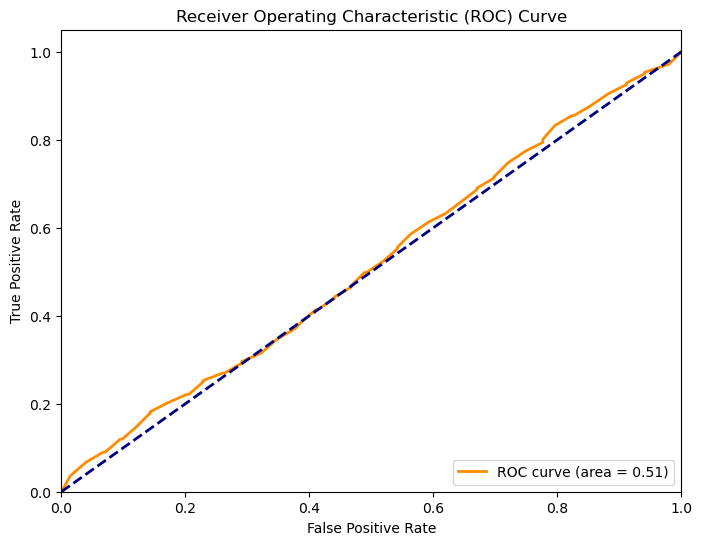

Validation Loss: 0.6991970539093018
Validation Accuracy: 0.5375000238418579
Test Loss: 0.700281023979187
Test Accuracy: 0.5116666555404663
ROC AUC: 0.5148866809822095
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [53]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Attention Mechanism+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")

# Densenet+Capsule network+Dense

In [7]:
import tensorflow as tf

# Define Capsule Layer
class CapsuleLayer(tf.keras.layers.Layer):
    def __init__(self, num_capsule, dim_capsule, routings=3, **kwargs):
        super(CapsuleLayer, self).__init__(**kwargs)
        self.num_capsule = num_capsule
        self.dim_capsule = dim_capsule
        self.routings = routings

    def build(self, input_shape):
        input_dim_capsule = input_shape[-1]
        self.W = self.add_weight(shape=[input_dim_capsule, self.num_capsule * self.dim_capsule],
                                 initializer='glorot_uniform',
                                 name='W')

    def call(self, u_vecs):
        u_hat_vecs = tf.reduce_sum(tf.expand_dims(u_vecs, -1) * tf.expand_dims(self.W, 0), axis=-2)
        b = tf.zeros(shape=[tf.shape(u_hat_vecs)[0], self.num_capsule])
        for i in range(self.routings):
            c = tf.nn.softmax(b, axis=1)
            s_j = tf.reduce_sum(tf.multiply(c[:, :, None], u_hat_vecs), axis=1)
            v_j = self.squash(s_j)
            if i < self.routings - 1:
                b += tf.reduce_sum(tf.multiply(v_j[:, None, :], u_hat_vecs), axis=-1)
        return v_j

    def squash(self, s_j):
        s_squared_norm = tf.reduce_sum(tf.square(s_j), axis=-1, keepdims=True)
        scale = s_squared_norm / (1 + s_squared_norm) / tf.sqrt(s_squared_norm + tf.keras.backend.epsilon())
        return scale * s_j

# Load pre-trained DenseNet201 model without top (include_top=False)
base_model = tf.keras.applications.DenseNet201(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Additional layers
x = base_model.output

# Flatten the output of DenseNet
x = tf.keras.layers.Flatten()(x)

# Reshape to fit Capsule Layer
x = tf.keras.layers.Reshape((-1, x.shape[-1]))(x)

# Capsule Network
capsule = CapsuleLayer(num_capsule=10, dim_capsule=16, routings=3)(x)  # Example: 10 capsules with dimension 16

# Flatten the output
capsule = tf.keras.layers.Flatten()(capsule)

# Dense layer after Capsule Network
output = tf.keras.layers.Dense(1, activation='sigmoid')(capsule)  # Use a single output unit for binary classification

# Create the full model
model = tf.keras.models.Model(inputs=base_model.input, outputs=output)

# Freeze the layers of the base model
for layer in base_model.layers:
    layer.trainable = False

# Compile the model with Adam optimizer
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display model summary
model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_2    │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,408 │ zero_padding2d_2… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_3    │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 56, 56,    │          0 │ zero_padding2d_3… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 56, 56,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 56, 56,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 56, 56,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 56, 56,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 56, 56,    │     12,288 │ conv2_block2_0_r

 Total params: 33,374,945 (127.32 MB)

 Trainable params: 15,052,961 (57.42 MB)

 Non-trainable params: 18,321,984 (69.89 MB)

In [11]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=50,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 128s 2s/step - accuracy: 0.7008 - loss: 0.5908 - val_accuracy: 0.8571 - val_loss: 0.3774
Epoch 2/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 122s 2s/step - accuracy: 0.8785 - loss: 0.3371 - val_accuracy: 0.8732 - val_loss: 0.3188
Epoch 3/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.9261 - loss: 0.2297 - val_accuracy: 0.8839 - val_loss: 0.3024
Epoch 4/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 121s 2s/step - accuracy: 0.9374 - loss: 0.1846 - val_accuracy: 0.8839 - val_loss: 0.3116
Epoch 5/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9659 - loss: 0.1189 - val_accuracy: 0.8554 - val_loss: 0.3682
Epoch 6/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9589 - loss: 0.1225 - val_accuracy: 0.8732 - val_loss: 0.3192
Epoch 7/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9821 - loss: 0.0723 - val_accuracy: 0.8804 - val_loss: 0.3297
Epoch 8/50
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9815 - loss: 0.0593 - val_accuracy: 0.9018 - v

18/18 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Inference Time: 22.613276958465576 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step


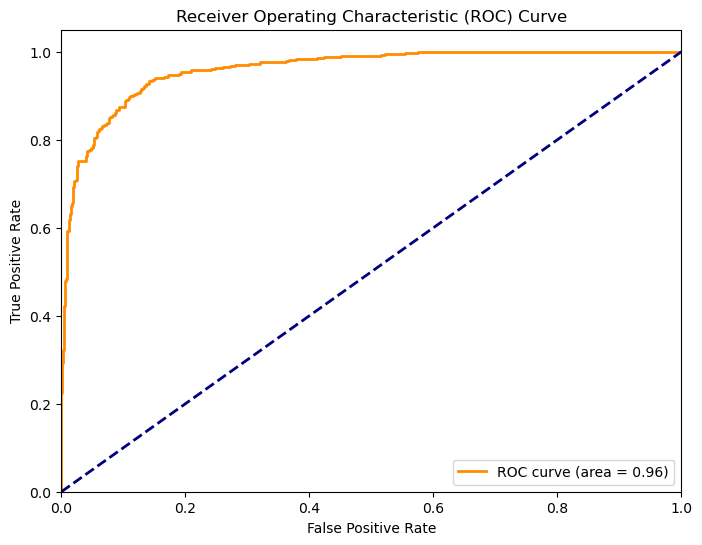

Validation Loss: 0.2818184792995453
Validation Accuracy: 0.8928571343421936
Test Loss: 0.2705414593219757
Test Accuracy: 0.8916666507720947
ROC AUC: 0.9596401829125824
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [12]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_50_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_50_metrics.csv',index=False)
print("Metrics saved successfully")

In [8]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=100,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 126s 2s/step - accuracy: 0.5048 - loss: 0.7460 - val_accuracy: 0.6411 - val_loss: 0.6742
Epoch 2/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.7144 - loss: 0.6507 - val_accuracy: 0.8161 - val_loss: 0.5173
Epoch 3/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.8431 - loss: 0.4338 - val_accuracy: 0.8625 - val_loss: 0.3511
Epoch 4/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9089 - loss: 0.2716 - val_accuracy: 0.8643 - val_loss: 0.3334
Epoch 5/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9305 - loss: 0.1976 - val_accuracy: 0.8786 - val_loss: 0.2978
Epoch 6/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9530 - loss: 0.1448 - val_accuracy: 0.8375 - val_loss: 0.3939
Epoch 7/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9709 - loss: 0.1092 - val_accuracy: 0.8821 - val_loss: 0.3185
Epoch 8/100
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9752 - loss: 0.0851 - val_accuracy: 0.

18/18 ━━━━━━━━━━━━━━━━━━━━ 22s 1s/step
Inference Time: 21.967403411865234 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step


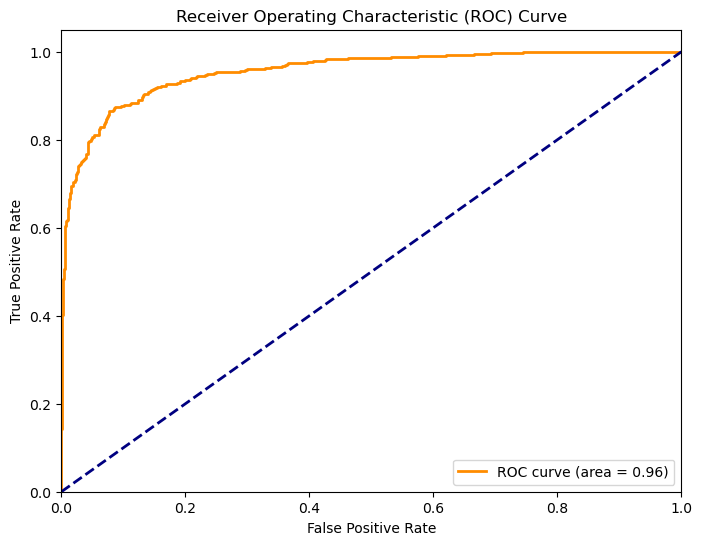

Validation Loss: 0.2977856397628784
Validation Accuracy: 0.8785714507102966
Test Loss: 0.2980005741119385
Test Accuracy: 0.8833333253860474
ROC AUC: 0.955053460763916
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [9]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_100_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_100_metrics.csv',index=False)
print("Metrics saved successfully")

In [10]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=150,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9499 - loss: 0.1495 - val_accuracy: 0.8714 - val_loss: 0.3294
Epoch 2/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9501 - loss: 0.1300 - val_accuracy: 0.9000 - val_loss: 0.2904
Epoch 3/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9757 - loss: 0.0820 - val_accuracy: 0.8750 - val_loss: 0.3548
Epoch 4/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9760 - loss: 0.0764 - val_accuracy: 0.8768 - val_loss: 0.3430
Epoch 5/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9871 - loss: 0.0477 - val_accuracy: 0.8839 - val_loss: 0.3423
Epoch 6/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9878 - loss: 0.0445 - val_accuracy: 0.8875 - val_loss: 0.3714
Epoch 7/150
70/70 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9859 - loss: 0.0468 - val_accuracy: 0.8821 - val_loss: 0.3102
Training Time: 839.5375208854675 seconds


18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
Inference Time: 18.558892011642456 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step


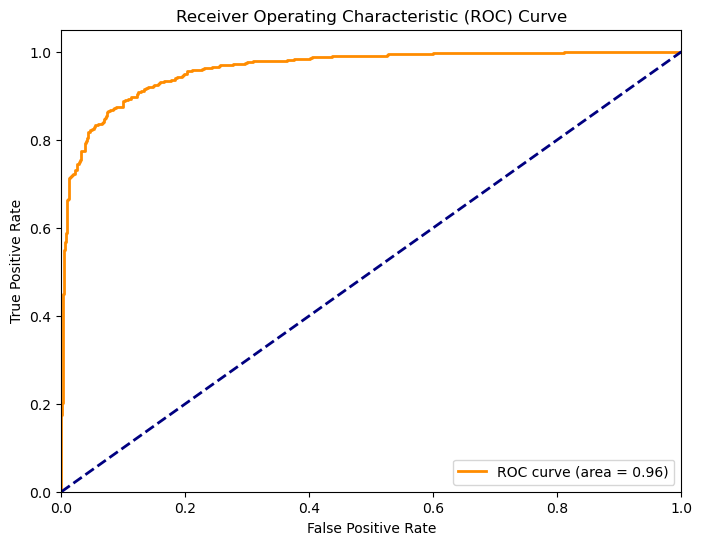

Validation Loss: 0.29040205478668213
Validation Accuracy: 0.8999999761581421
Test Loss: 0.2713717222213745
Test Accuracy: 0.8924999833106995
ROC AUC: 0.9615149256222254
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [11]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_150_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_150_metrics.csv',index=False)
print("Metrics saved successfully")

In [12]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.callbacks import EarlyStopping
import time

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Fit label encoder and transform labels to numerical values
y_train_encoded = label_encoder.fit_transform(y_train)
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Record start time
start_train_time = time.time()

# Define early stopping criteria
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train the model with early stopping
history = model.fit(X_train_preprocessed, y_train_encoded, batch_size=32, epochs=200,
                    validation_data=(X_val_preprocessed, y_val_encoded),
                    callbacks=[early_stopping])

# Record end time
end_train_time = time.time()

# Calculate training time
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")


Epoch 1/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9758 - loss: 0.0808 - val_accuracy: 0.9018 - val_loss: 0.3084
Epoch 2/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9667 - loss: 0.0980 - val_accuracy: 0.8964 - val_loss: 0.3355
Epoch 3/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9823 - loss: 0.0479 - val_accuracy: 0.8786 - val_loss: 0.3842
Epoch 4/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9835 - loss: 0.0522 - val_accuracy: 0.8893 - val_loss: 0.3519
Epoch 5/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9895 - loss: 0.0311 - val_accuracy: 0.8536 - val_loss: 0.4744
Epoch 6/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9815 - loss: 0.0427 - val_accuracy: 0.8768 - val_loss: 0.3050
Epoch 7/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 119s 2s/step - accuracy: 0.9861 - loss: 0.0394 - val_accuracy: 0.8839 - val_loss: 0.4187
Epoch 8/200
70/70 ━━━━━━━━━━━━━━━━━━━━ 120s 2s/step - accuracy: 0.9955 - loss: 0.0139 - val_accuracy: 0.

18/18 ━━━━━━━━━━━━━━━━━━━━ 18s 1s/step
Inference Time: 18.401156187057495 seconds
38/38 ━━━━━━━━━━━━━━━━━━━━ 39s 1s/step


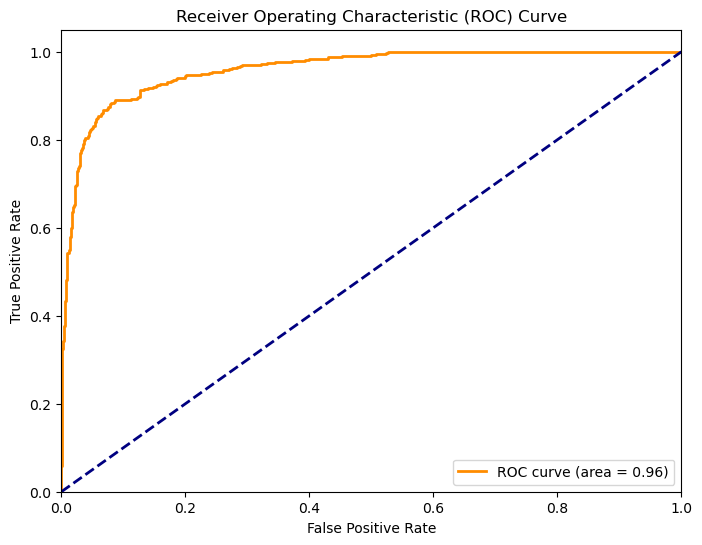

Validation Loss: 0.3049848675727844
Validation Accuracy: 0.8767856955528259
Test Loss: 0.2768280506134033
Test Accuracy: 0.8966666460037231
ROC AUC: 0.9591200391637645
Cohen's Kappa: 0.0
Balanced Accuracy: 0.5
Matthews Correlation Coefficient: 0.0
Classification Report:
              precision    recall  f1-score   support

           0       0.52      1.00      0.68       622
           1       0.00      0.00      0.00       578

    accuracy                           0.52      1200
   macro avg       0.26      0.50      0.34      1200
weighted avg       0.27      0.52      0.35      1200

Confusion Matrix:
[[622   0]
 [578   0]]
Metrics saved successfully


/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/lab4/.local/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [13]:
from sklearn.metrics import accuracy_score, roc_auc_score, cohen_kappa_score, balanced_accuracy_score, matthews_corrcoef, roc_curve, auc, classification_report, confusion_matrix
import numpy as np
import time
import matplotlib.pyplot as plt
import pandas as pd

# Record start time for inference
start_inference_time = time.time()

# Predict on validation set
y_val_pred = model.predict(X_val_preprocessed)

# Record end time for inference
end_inference_time = time.time()

# Calculate inference time
inference_time = end_inference_time - start_inference_time
print("Inference Time:", inference_time, "seconds")

# Convert predicted probabilities to class labels
y_val_pred_classes = np.argmax(y_val_pred, axis=1)
y_test_pred = model.predict(X_test_preprocessed)
y_test_pred_classes = np.argmax(y_test_pred, axis=1)

# Calculate test loss, test accuracy, validation loss, validation accuracy
test_loss, test_accuracy = model.evaluate(X_test_preprocessed, y_test_encoded, verbose=0)
val_loss, val_accuracy = model.evaluate(X_val_preprocessed, y_val_encoded, verbose=0)

# Calculate metrics
roc_auc = roc_auc_score(y_test_encoded, y_test_pred, average='macro')
kappa = cohen_kappa_score(y_test_encoded, y_test_pred_classes)
balanced_accuracy = balanced_accuracy_score(y_test_encoded, y_test_pred_classes)
mcc = matthews_corrcoef(y_test_encoded, y_test_pred_classes)

# Compute ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test_encoded, y_test_pred)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Classification report and confusion matrix
classification_rep = classification_report(y_test_encoded, y_test_pred_classes)
conf_matrix = confusion_matrix(y_test_encoded, y_test_pred_classes)

# Print metrics
print("Validation Loss:", val_loss)
print("Validation Accuracy:", val_accuracy)
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)
print("ROC AUC:", roc_auc)
print("Cohen's Kappa:", kappa)
print("Balanced Accuracy:", balanced_accuracy)
print("Matthews Correlation Coefficient:", mcc)
# Print classification report and confusion matrix
print("Classification Report:")
print(classification_rep)
print("Confusion Matrix:")
print(conf_matrix)

existing_metrics_df=pd.read_csv('Densenet_4000_epoch_200_metrics.csv')
metrics={
    'Combination':['Densenet+Capsule Network+Dense'],
    'Validation Accuracy':[val_accuracy*100],
    'Validation Loss':[val_loss],
    'Test Accuracy':[test_accuracy*100],
    'Test Loss':[test_loss],
    'Training time':[training_time],
    'Inference time':[inference_time],
    'Cohens Kappa':[kappa],
    'MCC':[mcc],
    'Balanced Accuracy':[balanced_accuracy]
}
new_metrics_df=pd.DataFrame(metrics)
updated_metrics_df=pd.concat([existing_metrics_df,new_metrics_df],ignore_index=True)
updated_metrics_df.to_csv('Densenet_4000_epoch_200_metrics.csv',index=False)
print("Metrics saved successfully")